# **Bird Pose Estimation with ConvNeXt U-Net Using the CUB-200-2011 Dataset**

This notebook presents a complete pipeline for animal pose estimation, where a **custom U-Net-based architecture** is implemented using a pre-trained [ConvNeXt Base](https://arxiv.org/pdf/2201.03545) model as the encoder (backbone). The encoder layers are fine-tuned, while the decoder layers are trained from scratch. The network is designed to predict keypoints via **heatmaps**, producing output maps of the same spatial resolution as the input images similar in structure to semantic segmentation tasks.

For this study, we use the [CUB-200-2011](https://www.vision.caltech.edu/datasets/cub_200_2011/) dataset, which contains 11,788 images of 200 bird species, split into 5,994 training and 5,794 test images. Each bird image is annotated with **15 keypoints** representing specific body parts. Moreover, since each image contains only a single bird, the dataset is particularly well-suited for fundamental pose estimation tasks.

## **Imports**

To accelerate training, evaluation, and inference times, this project makes use of the Google Colab TPU. However, in the current TPU environments, TensorFlow is not preinstalled by default, so the latest version of TensorFlow must be installed manually.

In [ ]:
# Install TensorFlow, Keras, and TPU runtime for Colab TPU support
!pip install tensorflow==2.18.0 -q
!pip install tf-keras==2.18.0 -q
!pip install tensorflow-tpu==2.18.0 --find-links=https://storage.googleapis.com/libtpu-tf-releases/index.html -q

# Install additional libraries for data augmentation and visualization
!pip install albumentations pydot graphviz kaleido==0.2.1 -q

In [ ]:
import os
os.environ["TF_USE_LEGACY_KERAS"] = "1"

import tensorflow as tf
import numpy as np
import pandas as pd
import albumentations as A
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import plotly.graph_objects as go
from google.colab import drive
from glob import glob
from tqdm import tqdm
import requests
import json
import cv2
import os
import io

In [ ]:
# Mount Google Drive in Colab
drive.mount("/content/drive/", force_remount=True)

Mounted at /content/drive/


## **Configuration**

In [2]:
config = {
    # Paths to the preprocessed dataset and the trained model
    "data_zip_path": "/content/drive/MyDrive/Datasets/CUB-200-2011.zip",
    "model_save_path": "/content/drive/MyDrive/models/AnimalPoseEstimation_ConvNeXtBase-U-Net_CUB-200-2011.weights.h5",

    # Checkpoint
    "checkpoint_folder": "/content/drive/MyDrive/checkpoints/AnimalPoseEstimation_ConvNeXtBase-U-Net_CUB-200-2011",
    "save_freq": 20, # Frequency in epochs to save checkpoints

    # Dataset and training hyperparameters
    "epochs": 50,
    "batch_size": 32,
    "buffer_size": 1024, # Buffer size for shuffling the dataset
    "seed": 123, # Random seed for reproducibility
    "image_size": (384, 384), # Dimensions to which all images will be resized: (height, width)
    "kernel_size": (49, 49),  # Gaussian kernel size for heatmap generation
    "heatmap_sigma": 9.0, # Standard deviation for the Gaussian heatmap

    # Learning rate scheduler
    "lr0": 1e-3, # Initial learning rate
    "lrf": 1e-5, # Final learning rate
    "power": 2.0, # Polynomial decay power

    # Early stopping
    "patience": 7, # Number of epochs with no improvement before stopping
    "monitor": "val_oks", # Metric to monitor
    "mode": "max" # 'min': stops when metric stops decreasing; 'max': when it stops increasing
}

# Extract directory name from zip file path
config["data_dir"] = os.path.basename(config["data_zip_path"]).split(".")[0]

## **Dataset Preparation**

### **Load Preprocessed Dataset**

The download and detailed preprocessing of the **CUB-200-2011** dataset for pose estimation were completed in the following notebook: [**Preprocessing_CUB-200-2011**](https://github.com/JersonGB22/PoseEstimation-TensorFlow-PyTorch/blob/main/Preprocessing/Preprocessing_CUB-200-2011.ipynb).

The dataset metadata includes the following key elements:

* The total number of keypoints.
* The **skeleton**, a dictionary where the keys are the names of the keypoints and the values are lists of two elements: the first is the keypoint ID, and the second is the connection ID. This structure is essential for understanding the pose skeleton and accurately visualizing connections during inference.
* The IDs of symmetric keypoints, which are required to correctly apply **random horizontal flipping** during data augmentation.

In [ ]:
# Unzip the preprocessed dataset
!unzip -q {config["data_zip_path"]}

In [ ]:
# Load dataset metadata
with open(os.path.join(config["data_dir"], "metadata.json")) as f:
    metadata = json.load(f)

skeleton = metadata["skeleton"]
symmetric_kpts = metadata["symmetric_kpts"]
config["nkpts"] = metadata["nkpts"]

skeleton

{'back': [0, 9],
 'beak': [1, 1],
 'belly': [2, 3],
 'breast': [3, 14],
 'crown': [4, 5],
 'forehead': [5, 1],
 'left eye': [6, 5],
 'left leg': [7, 2],
 'left wing': [8, 0],
 'nape': [9, 4],
 'right eye': [10, 5],
 'right leg': [11, 2],
 'right wing': [12, 0],
 'tail': [13, 0],
 'throat': [14, 1]}

### **Data Augmentation**

For data augmentation, the [Albumentations](https://albumentations.ai/docs/examples/example-keypoints/) library is used a fast, flexible, and widely adopted tool in the field of computer vision. The `Affine` transformation is applied to perform **random scaling, translation, and rotation** on both the images and their corresponding keypoints. Additionally, `RandomBrightnessContrast` is used to randomly alter the **brightness and contrast** of the images.

As for **random horizontal flipping**, Albumentations is not used in this case. The reason is that the **CUB-200-2011** dataset contains **symmetric keypoints**, and each keypoint includes a third element that indicates its **visibility**. Albumentations does not provide native support for symmetric keypoints or visibility handling. Although the experimental version of Albumentations includes a transformation for symmetric keypoints, it does not support the visibility attribute in its format. Therefore, a custom class is implemented to handle random horizontal flipping correctly, taking into account both keypoint symmetry and visibility.

Finally, it is important to note that data augmentation is applied only to the training set. Since the **rotation** transformation of `Affine` alters the coordinates of the bounding boxes (whether using the *largest_box* or *ellipse* methods), and the model is evaluated with the most relevant pose estimation metrics **OKS** and **PCK**, both of which depend on bounding boxes evaluation should be performed exclusively on the validation and/or test sets to ensure accurate results. In addition, this approach saves computation time by avoiding unnecessary augmentation of bounding boxes.

In [ ]:
class HorizontalFlipSymmetricKeypoints():
    """
    Randomly applies a horizontal flip to an image and its keypoints,
    taking into account symmetric keypoints and their visibility.

    Args:
        symmetric_kpts (list[list[int, int]]): List of pairs of symmetric keypoint indices.
        p (float, optional): Probability of applying the horizontal flip.
    """

    def __init__(self, symmetric_kpts=None, p=0.5):
        self.symmetric_kpts = symmetric_kpts
        self.p = p

    def __call__(self, image, keypoints):
        """
        Applies a horizontal flip to the image and its keypoints.

        Args:
            image (np.ndarray): Image array of shape (height, width, 3).
            keypoints (np.ndarray): Array of keypoints with shape (nkpts, 3),
                where each keypoint is (x, y, visibility).

        Returns:
            (tuple[np.ndarray, np.ndarray]): Flipped image and transformed keypoints,
                with symmetric pairs swapped.
        """
        if np.random.rand() >= self.p:
            return image, keypoints

        # Apply standard horizontal flip to the image
        image_flip = np.ascontiguousarray(np.fliplr(image))
        keypoints_flip = keypoints.copy()
        width = image.shape[1]

        # Flip x-coordinates of visible keypoints
        mask = keypoints_flip[:, 2] > 0
        keypoints_flip[mask, 0] = np.clip(width - keypoints_flip[mask, 0], 0, width - 1e-6)

        # Swap symmetric keypoint pairs
        if self.symmetric_kpts:
            for pair in self.symmetric_kpts:
                keypoints_flip[pair] = keypoints_flip[pair[::-1]]

        return image_flip, keypoints_flip


# Define the augmentation pipeline for pose estimation data
random_horizontal_flip = HorizontalFlipSymmetricKeypoints(symmetric_kpts, p=0.5)

random_affine = A.Compose(
    [
        A.Affine(
            scale=(0.7, 1.3),
            translate_percent=(-0.2, 0.2),
            rotate=(-30, 30),
            shear=(0.0, 0.0),
            p=0.6
        )
    ],
    keypoint_params=A.KeypointParams(
        format="xy",
        remove_invisible=False,
        check_each_transform=True
    ),
    p=1.0
)

random_brightness_contrast = A.Compose(
    [A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.3, p=0.5)],
    p=1.0
)

### **Build TensorFlow Training and Validation Datasets**

To build the TensorFlow datasets, we use the method [`tf.data.Dataset.from_generator`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#from_generator), which allows constructing a dataset from a Python generator. This approach provides the flexibility to use **NumPy operations** throughout the entire data pipeline loading, preprocessing, and augmentation without being limited to TensorFlow native methods such as `tf.data.Dataset.from_tensor_slices`. As a result, the dataset creation process becomes more similar to the PyTorch `torch.utils.data.Dataset` class, while maintaining full compatibility with **Google Colab’s TPU**, significantly accelerating model training.

Regarding the creation of **heatmaps** from keypoint coordinates, this is necessary because directly regressing the keypoint coordinates often leads to slower convergence. In contrast, heatmaps preserve spatial information and allow the model to infer joint positions by simply locating the **peak of the heatmap**. This technique is widely adopted in pose estimation for its stability and effectiveness.

Heatmaps are blurred using a **Gaussian filter** and normalized to avoid overfitting and ensure stable and efficient learning. The blur parameters, such as `kernel_size` and `sigma`, are determined proportionally to the image dimensions, assuming the model input and output share the same spatial resolution. Through experimentation, the following settings have produced the best results:

* Image size: (384, 384), kernel: (49, 49), sigma: 9.0
* Image size: (256, 256), kernel: (33, 33), sigma: 6.0
* Image size: (128, 128), kernel: (17, 17), sigma: 3.0

The **empirical rule** applied is that the kernel size should be approximately one-eighth of the image size (e.g., 256 / 8 = 32), and adjusted to the nearest odd number by adding 1 (32 + 1 = 33).

Larger input images allow the model to capture finer details and usually improve performance, but they also lead to longer training, evaluation, and inference times. For instance, training with (384, 384) images takes approximately 2.25 times longer than with (256, 256) images, since (384 × 384) / (256 × 256) = 2.25.

Some approaches fix the output heatmap size (e.g., 64×64), regardless of the input size. However, accurately upscaling these fixed-size heatmaps back to the original resolution is challenging and may lead to precision loss, particularly for large input images.

Finally, it is worth noting that image normalization is not required during dataset preparation, as the **ConvNeXt Base** model includes an internal normalization layer at the beginning of its architecture.

In [ ]:
def keypoints_to_heatmaps(keypoints, heatmap_size, kernel_size=(33, 33), sigma=6.0):
    """
    Converts keypoints into heatmaps using Gaussian blur.

    Args:
        keypoints (np.ndarray): Array of shape (nkpts, 3), where each row is (x, y, visibility).
        heatmap_size (tuple[int, int]): Heatmap size as (height, width).
        kernel_size (tuple[int, int], optional): Size of the Gaussian kernel (must be odd numbers).
        sigma (float, optional): Standard deviation used for Gaussian blur.

    Returns:
        (np.ndarray): Array of heatmaps with shape (height, width, nkpts).
    """
    heatmaps = []
    for x, y, v in keypoints.astype(np.int32):
        # Initialize an empty heatmap for the current keypoint
        heatmap = np.zeros(heatmap_size, np.float32)

        # Apply Gaussian only if the keypoint is labeled
        if v > 0:
            heatmap[y, x] = 1
            heatmap = cv2.GaussianBlur(heatmap, kernel_size, sigma, borderType=cv2.BORDER_CONSTANT)
            heatmap /= heatmap.max() # Normalize heatmap to [0, 1] range

        heatmaps.append(heatmap)
    return np.stack(heatmaps, axis=-1)


@tf.function
def heatmaps_to_keypoints(heatmaps, mode="max"):
    """
    Extracts (x, y, visibility) keypoint coordinates from heatmaps.
    Two methods are available:
        - "max": takes the position of the maximum value in the heatmap.
        - "mean": computes the center of mass (soft-argmax) as a weighted average.

    Args:
        heatmaps (tf.Tensor): Tensor of shape (batch_size, height, width, nkpts).
        mode (str, optional): One of {"max", "mean"} indicating the extraction method.

    Returns:
        (tf.Tensor): Keypoints of shape (batch_size, nkpts, 3), where each row is (x, y, v).
            Visibility is set to 2 for detected keypoints (confidence > 0.5),
            and 0 for undetected ones, following the COCO format.
    """
    if mode not in {"max", "mean"}:
        raise ValueError("Método inválido. Usar 'max' o 'mean'.")

    B, H, W, N = tf.unstack(tf.shape(heatmaps))

    # Flatten spatial dimensions for easier indexing
    heatmaps_flat = tf.reshape(tf.transpose(heatmaps, (0, 3, 1, 2)), (B, N, -1))

    if mode == "max":
        # Get index of the maximum activation for each heatmap
        indices = tf.cast(tf.argmax(heatmaps_flat, axis=-1), tf.int32)
        x, y = indices % W, indices // W

    else:
        # Normalize heatmaps to form valid probability distributions
        heatmaps_norm = tf.math.divide_no_nan(heatmaps, tf.reduce_sum(heatmaps, axis=[1, 2], keepdims=True))

        # Generate x and y coordinate grids
        xs = tf.reshape(tf.range(W), (1, 1, W, 1))
        ys = tf.reshape(tf.range(H), (1, H, 1, 1))

        # Compute weighted averages along each axis
        x = tf.reduce_sum(heatmaps_norm * tf.cast(xs, tf.float32), axis=[1, 2])
        y = tf.reduce_sum(heatmaps_norm * tf.cast(ys, tf.float32), axis=[1, 2])

    # Compute keypoints and set visibility to 2 if confidence > 0.5, otherwise 0
    v = tf.reduce_max(heatmaps_flat, axis=-1) > 0.5
    keypoints = tf.stack([x, y,  2 * tf.cast(v, x.dtype)], axis=-1)

    return tf.cast(keypoints, tf.float32)

In [ ]:
class PoseGenerator():
    """
    Custom data generator for pose estimation tasks.

    Args:
        config (dict): Configuration with data and training parameters.
        split (str, optional): Either 'train' or 'test', indicating dataset partition.
        training (bool, optional): If True, applies data augmentation and generates images,
            keypoints, and heatmaps. If False, skips augmentation and also includes bounding boxes.
    """

    def __init__(self, config, split="train", training=True):
        if split not in {"train", "test"}:
            raise ValueError("Invalid dataset split. Must be 'train' or 'test'.")

        # Load image and label paths based on the split
        self.image_paths = sorted(glob(os.path.join(config["data_dir"], f"{split}/images/*.jpg")))
        self.label_paths = sorted(glob(os.path.join(config["data_dir"], f"{split}/labels/*.txt")))

        self.height, self.width = config["image_size"]
        self.config = config
        self.training = training

    def data_augmentation(self, image, keypoints):
        """
        Apply data augmentation to image and keypoints.

        Args:
            image (np.ndarray): Input image as (height, width, 3).
            keypoints (np.ndarray): Array of keypoints (nkpts, 3) in (x, y, visibility) format.

        Returns:
            (tuple[np.ndarray, np.ndarray]): Augmented image and keypoints.
        """
        image, keypoints = random_horizontal_flip(image, keypoints)

        transformed = random_affine(image=image, keypoints=keypoints[:, :2])
        keypoints_trans = transformed["keypoints"]

        # Create mask for valid keypoints after affine transformation
        mask = (keypoints[:, 2] > 0) & (
            (keypoints_trans[:, 0] >= 0) & (keypoints_trans[:, 1] >= 0) &
            (keypoints_trans[:, 0] < self.width) & (keypoints_trans[:, 1] < self.height)
        )

        # Apply the affine transformation only if at least one keypoint is visible
        if np.sum(mask) > 0:
            keypoints_trans = np.concat([keypoints_trans, keypoints[:, 2:]], axis=-1)
            keypoints = np.where(mask[:, None], keypoints_trans, np.zeros_like(keypoints_trans))
            image = transformed["image"]

        image = random_brightness_contrast(image=image)["image"]
        return image, keypoints

    def __call__(self):
        """
        Generator that yields training or evaluation samples.

        Yields:
            (dict[str, np.ndarray]): Contains images, heatmaps, and keypoints.
                If not in training mode, also yields bounding boxes.
        """
        for img_path, label_path in zip(self.image_paths, self.label_paths):
            # Load and resize image
            image = Image.open(img_path).convert("RGB")
            image = np.array(image.resize((self.width, self.height)))

            # Load label: [xmin, ymin, width, height, x1, y1, v1, ..., xn, yn, vn]
            label = np.loadtxt(label_path, dtype=np.float32)

            # Extract and denormalize keypoints
            keypoints = label[4:].reshape(-1, 3)
            keypoints[:, 0] *= self.width
            keypoints[:, 1] *= self.height

            # Apply augmentation if training
            if self.training:
                image, keypoints = self.data_augmentation(image, keypoints)

            # Generate heatmaps from keypoints using Gaussian blur
            keypoints = keypoints.astype(np.int32)
            heatmaps = keypoints_to_heatmaps(
                keypoints, (self.height, self.width),
                self.config["kernel_size"], self.config["heatmap_sigma"]
            )

            data = {"images": image, "heatmaps": heatmaps, "keypoints": keypoints}

            # Extract and denormalize bounding box if configured
            if not self.training:
                data["bboxes"] = np.array([
                    label[0] * self.width,
                    label[1] * self.height,
                    label[2] * self.width,
                    label[3] * self.height
                ])

            yield data

In [ ]:
def create_dataset(config, split="train", training=True, drop_remainder=True):
    """
    Creates a TensorFlow dataset from the pose generator.

    Args:
        config (dict): Configuration with data and training parameters.
        split (str, optional): Dataset split to load: "train" or "test".
        training (bool, optional): If True, applies shuffling, data augmentation and generates images,
            keypoints, and heatmaps. If False, skips augmentation and also includes bounding boxes.
        drop_remainder (bool, optional): Whether to drop the last batch if it's smaller than batch_size.

    Returns:
        (tf.data.Dataset): configured dataset with batching and prefetching.
    """
    # Define output signature
    output_signature = {
        "images": tf.TensorSpec(shape=config["image_size"] + (3,), dtype=tf.float32),
        "heatmaps": tf.TensorSpec(shape=config["image_size"] + (config["nkpts"],), dtype=tf.float32),
        "keypoints": tf.TensorSpec(shape=(config["nkpts"], 3), dtype=tf.float32)
    }
    if not training:
        output_signature["bboxes"] = tf.TensorSpec(shape=(4,), dtype=tf.float32)

    # Create dataset from generator
    dataset = tf.data.Dataset.from_generator(
        PoseGenerator(config, split, training),
        output_signature=output_signature
    )

    # Enforce cardinality and report size
    size = len(os.listdir(os.path.join(config["data_dir"], f"{split}/images")))
    dataset = dataset.apply(tf.data.experimental.assert_cardinality(size))
    print(
        f"{split.capitalize()} Dataset: size={size}, "
        f"deleted_records={size % config['batch_size'] if drop_remainder else 0}"
    )

    # Shuffle for training
    if training:
        dataset = dataset.shuffle(config["buffer_size"], seed=config["seed"])

    # Batch and prefetch
    dataset = (
        dataset.
        batch(config["batch_size"], drop_remainder=drop_remainder).
        prefetch(tf.data.AUTOTUNE)
    )
    return dataset

In [ ]:
train_dataset = create_dataset(config)
test_dataset = create_dataset(config, split="test", training=False, drop_remainder=False)

config["total_steps"] = len(train_dataset) * config["epochs"]

Train Dataset: size=5990, deleted_records=6
Test Dataset: size=5781, deleted_records=0


In [ ]:
# Take a batch from the test dataset
for dic in test_dataset.take(1):
    for k, v in dic.items():
        print(k, v.shape)

images (32, 384, 384, 3)
heatmaps (32, 384, 384, 15)
keypoints (32, 15, 3)
bboxes (32, 4)


In [ ]:
# Take a batch from the training dataset
for dic in train_dataset.take(1):
    for k, v in dic.items():
        print(k, v.shape)

images (32, 384, 384, 3)
heatmaps (32, 384, 384, 15)
keypoints (32, 15, 3)


### **Pose Visualization Utility Class**

In [ ]:
class PoseVisualizer():
    """
    Utility for visualizing pose estimation results: keypoints, skeleton connections, and heatmaps.

    Args:
        skeleton (dict[str, dict]): Mapping of keypoint index pairs defining skeleton edges.
    """

    def __init__(self, skeleton):
        self.skeleton = skeleton

    def draw_pose(self, ax, keypoints, show_points=True, show_lines=True, show_kpts_ids=True):
        """
        Draws keypoints and skeleton on a given Matplotlib Axes.

        Args:
            ax (plt.Axes): Matplotlib axes to draw on.
            keypoints (np.ndarray): Array of shape (nkpts, 3) with (x, y, v).
            show_points (bool, optional): Whether to plot keypoint markers.
            show_lines (bool, optional): Whether to draw skeleton connections.
            show_kpts_ids (bool, optional): Whether to annotate keypoints with their indices.
        """
        for ids in self.skeleton.values():
            # Draw line if both keypoints are visible
            if show_lines and np.all(keypoints[ids, 2] > 0):
                ax.plot(
                    keypoints[ids, 0],
                    keypoints[ids, 1],
                    color="blue",
                    linewidth=1.5,
                    zorder=1
                )

            # Draw individual keypoint if visible
            id = ids[0]
            x, y, v = keypoints[id]
            if v > 0:
                # Draw keypoint as a circle
                if show_points:
                    ax.scatter(
                        x, y,
                        facecolors="cyan",
                        edgecolors="blue",
                        linewidths=1.5,
                        s=(80 if id > 9 else 70) if show_kpts_ids else 50,
                        zorder=2
                    )

                # Display keypoint ID as label
                if show_kpts_ids:
                    ax.text(
                        x, y, str(id),
                        fontsize=5.25, fontweight="bold",
                        ha="center", va="center", zorder=3
                    )

    def download_images(self, urls, image_size=None):
        """
        Downloads and optionally resizes images from URLs.

        Args:
            urls (list[str]): List of image URLs.
            image_size (tuple[int, int], optional): Desired (height, width). If provided, images are resized.

        Returns:
            (np.ndarray): Batch of images as a NumPy array of shape (N, H, W, 3).
        """
        images = []
        for url in urls:
            response = requests.get(url)
            image = Image.open(io.BytesIO(response.content)).convert("RGB")
            if image_size:
                image = image.resize(image_size[::-1])

            images.append(np.array(image))
        return np.stack(images)

    def plot_keypoints_heatmaps(
            self, images, keypoints, heatmaps=None, config=None, n_rows=2, alpha=0.6,
            random=True, show_points=True, show_lines=True, show_kpts_ids=True, save_path=None
    ):
        """
        Displays images with overlayed keypoints and summed heatmaps side by side.

        Args:
            images (np.ndarray): Batch of images (N, H, W, 3).
            keypoints (np.ndarray): Array of keypoints (N, nkpts, 3).
            config (dict): Configuration with data and training parameters. Required if heatmaps is None.
            heatmaps (np.ndarray, optional): Precomputed heatmaps (N, H, W, nkpts). If None, computed on the fly.
            n_rows (int, optional): Number of rows to display.
            alpha (float, optional): Transparency for heatmap overlay.
            random (bool, optional): Shuffle sample order if True.
            show_points (bool, optional): Whether to plot keypoint markers.
            show_lines (bool, optional): Whether to draw skeleton connections.
            show_kpts_ids (bool, optional): Whether to annotate keypoints with their indices.
            save_path (str, optional): File path to save the figure. If None, figure is not saved.
        """
        indices = np.arange(len(images))
        if random:
            np.random.shuffle(indices)

        fig, axes = plt.subplots(n_rows, 2, figsize=(9.6, 4.8 * n_rows))
        axes = np.array(axes).reshape(n_rows, 2)

        for col, title in enumerate(["Keypoints", "Heatmaps"]):
            axes[0, col].set_title(title, fontsize=9)

        for i in range(n_rows):
            idx = indices[i]
            image = images[idx]
            kpts = keypoints[idx]

            # Compute heatmaps if not provided
            if heatmaps is not None:
                hmaps = heatmaps[idx]
            else:
                hmaps = keypoints_to_heatmaps(kpts, config["image_size"], config["kernel_size"], config["heatmap_sigma"])

            # Combine and normalize heatmaps for visualization as a single overlay
            hmaps = hmaps.sum(axis=-1)
            hmaps = (hmaps - hmaps.min()) / hmaps.max()

            ax = axes[i, 0]
            ax.imshow(image)
            self.draw_pose(ax, kpts, show_points, show_lines, show_kpts_ids)
            ax.axis("off")

            ax = axes[i, 1]
            ax.imshow(image)
            ax.imshow(hmaps, cmap="jet", alpha=alpha)
            ax.axis("off")

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, bbox_inches="tight", pad_inches=0)
        plt.show()

    def plot_keypoints(
            self, images, keypoints, keypoints_pred=None, bboxes=None, areas_diags=None, metric=None,
            n_rows=2, n_cols=2, random=True, show_points=True, show_lines=True, show_kpts_ids=True,
            save_path=None
    ):
        """
        Shows true vs predicted keypoints and optionally computes metrics on each sample.

        Args:
            images (np.ndarray): Batch of images (N, H, W, 3).
            keypoints (np.ndarray): Ground-truth keypoints (N, nkpts, 3).
            keypoints_pred (np.ndarray, optional): Predicted keypoints (N, nkpts, 3). If None, only true keypoints are shown.
            areas_diags (np.ndarray, optional): Array of shape (N,) containing segmentation areas or bounding box diagonals,
                depending on the metric's requirements.
            metric (tf.keras.metrics.Metric, optional): Metric instance to update and display per sample.
            n_rows (int, optional): Number of rows.
            n_cols (int, optional): Number of columns when keypoints_pred is None.
            random (bool, optional): Shuffle sample order if True.
            show_points (bool, optional): Whether to plot keypoint markers.
            show_lines (bool, optional): Whether to draw skeleton connections.
            show_kpts_ids (bool, optional): Whether to annotate keypoints with their indices.
            save_path (str, optional): File path to save the figure. If None, figure is not saved.
        """

        indices = np.arange(len(images))
        if random:
            np.random.shuffle(indices)

        if keypoints_pred is None:
            fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.8 * n_cols, 4.8 * n_rows))
            axes = axes.flatten() if (n_rows * n_cols) > 1 else [axes]

            for i, ax in enumerate(axes):
                idx = indices[i]
                image = images[idx]
                kpts = keypoints[idx]

                ax.imshow(image)
                ax.axis("off")
                self.draw_pose(ax, kpts, show_points, show_lines, show_kpts_ids)

                if bboxes is not None:
                    bbox = bboxes[idx]
                    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1.75, edgecolor="red", facecolor="none")
                    ax.add_patch(rect)

        else:
            fig, axes = plt.subplots(n_rows, 2, figsize=(9.6, 4.8 * n_rows))
            axes = np.array(axes).reshape(n_rows, 2)

            for col, title in enumerate(["True Keypoints", "Pred Keypoints"]):
                axes[0, col].set_title(title, fontsize=9)

            for i in range(n_rows):
                idx = indices[i]
                image = images[idx]
                kpts_true = keypoints[idx]
                kpts_pred = keypoints_pred[idx]

                ax = axes[i, 0]
                ax.imshow(image)
                ax.axis("off")
                self.draw_pose(ax, kpts_true, show_points, show_lines, show_kpts_ids)

                ax = axes[i, 1]
                ax.imshow(image)
                ax.axis("off")
                self.draw_pose(ax, kpts_pred, show_points, show_lines, show_kpts_ids)

                # Compute and display the result of the metric
                if (areas_diags is not None) and (metric is not None):
                    metric.reset_state()
                    metric.update_state(
                        tf.constant(kpts_true[None, :], tf.float32),
                        tf.constant(kpts_pred[None, :], tf.float32),
                        tf.constant([areas_diags[idx]], tf.float32),
                    )

                    shape = image.shape
                    ax.text(
                        x=shape[1] / 2, y=shape[0],
                        s=f"{metric.name.upper()}: {float(metric.result()):.3f}",
                        fontsize=5.41, fontweight="bold", ha="center", va="top",
                    )

                if bboxes is not None:
                    bbox = bboxes[idx]
                    rect1 = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1.75, edgecolor="red", facecolor="none")
                    rect2 = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1.75, edgecolor="red", facecolor="none")
                    axes[i, 0].add_patch(rect1)
                    axes[i, 1].add_patch(rect2)

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, bbox_inches="tight", pad_inches=0)
        plt.show()

    def plot_from_urls(
            self, model, urls, image_size, n_rows=2, n_cols=2, random=False,
            show_points=True, show_lines=True, show_kpts_ids=True, save_path=None
    ):
        """
        Downloads images, runs model inference, and visualizes predicted keypoints.

        Args:
            model (tf.keras.Model): Pose estimation model in a non-distributed environment.
            urls (list[str]): List of image URLs.
            image_size (tuple[int, int]): (height, width) to resize images.
            n_rows (int, optional): Number of display rows.
            n_cols (int, optional): Number of display columns.
            random (bool, optional): Shuffle display order if True.
            show_points (bool, optional): Whether to plot keypoint markers.
            show_lines (bool, optional): Whether to draw skeleton connections.
            show_kpts_ids (bool, optional): Whether to annotate keypoints with their indices.
            save_path (str, optional): File path to save the figure. If None, figure is not saved.
        """
        images = self.download_images(urls[:n_rows * n_cols], image_size)
        heatmaps = model(tf.constant(images, tf.float32), training=False)
        keypoints = heatmaps_to_keypoints(heatmaps).numpy()

        self.plot_keypoints(
            images, keypoints, n_rows=n_rows, n_cols=n_cols, random=random,
            show_points=show_points, show_lines=show_lines, show_kpts_ids=show_kpts_ids,
            save_path=save_path
        )

In [ ]:
visualizer = PoseVisualizer(skeleton)

In [ ]:
images = dic["images"].numpy() / 255
heatmaps = dic["heatmaps"].numpy()
keypoints = dic["keypoints"].numpy()
#bboxes = dic["bboxes"].numpy()

As shown below, using the **'max'** mode to convert heatmaps into keypoint coordinates is highly accurate and will be used in this project to achieve the best possible results. Furthermore, in the loss function implemented later to estimate keypoint visibility, the maximum value of each heatmap is taken into account. Similarly, when evaluating visibility accuracy, the maximum value of the corresponding heatmap is also used.

In [ ]:
np.all(keypoints == heatmaps_to_keypoints(dic["heatmaps"]).numpy())

np.True_

In the following example, the number of pixels with values greater than zero in each heatmap with non-zero visibility is equal to the product of the kernel dimensions (in this case, 49 × 49 = 2401), except when the keypoints are located very close to the edges of the image.

In [ ]:
idx = 0
np.sum(heatmaps[idx] > 0, axis=(0, 1))

array([2401,    0,    0, 2401,    0,    0,    0, 2401,    0, 2205, 1323,
       2401, 2401, 2401, 2058])

In [ ]:
keypoints[idx]

array([[224.,  48.,   2.],
       [  0.,   0.,   0.],
       [  0.,   0.,   0.],
       [317.,  46.,   2.],
       [  0.,   0.,   0.],
       [  0.,   0.,   0.],
       [  0.,   0.,   0.],
       [290., 123.,   2.],
       [  0.,   0.,   0.],
       [240.,  20.,   2.],
       [266.,   2.,   2.],
       [284., 157.,   2.],
       [225., 109.,   2.],
       [111., 186.,   2.],
       [306.,  17.,   2.]], dtype=float32)

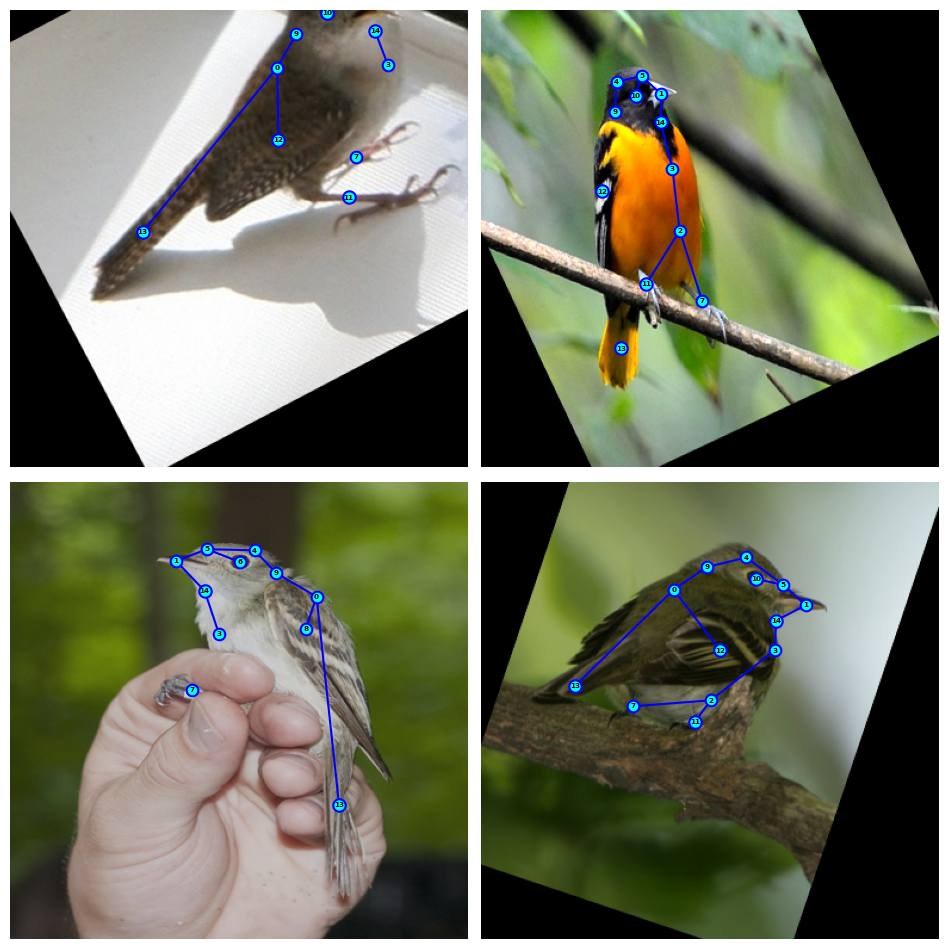

In [ ]:
visualizer.plot_keypoints(images, keypoints, random=False)

## **Build the Model**

The architecture of the [U-Net](https://arxiv.org/abs/1505.04597) model consists of a contraction path (encoder) to capture context and a symmetric expansion path (decoder) that allows for precise localization. To improve the model's performance, an additional convolutional block is added to both the encoder and the decoder, bringing the total number of blocks to five, compared to the four in the original U-Net model. Additionally, two **Batch Normalization** layers are incorporated into each convolutional block to help mitigate **overfitting** and **gradient vanishing**, common issues in deep neural networks. This modified U-Net architecture is generic and can be adapted to semantic segmentation tasks (using a `softmax` activation in the final layer), or, as in this case, to pose estimation tasks where the output layer uses a `sigmoid` activation, since the heatmaps are in the [0, 1] range.

![U-Net](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png)
*Original U-Net model*

In [3]:
def conv2d_block(inputs, filters, use_bn):
    """
    Builds a convolutional block with two Conv2D layers, optional BatchNormalization, and ReLU activation.

    Args:
        inputs (tf.Tensor): Input tensor to the block.
        filters (int): Number of filters for each convolutional layer.
        use_bn (bool): If True, applies Batch Normalization after each convolution.

    Returns:
        (tf.Tensor): Output tensor after applying the convolutional block.
    """
    x = tf.keras.layers.Conv2D(filters, kernel_size=3, padding="same")(inputs)
    if use_bn:
        x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation("relu")(x)

    x = tf.keras.layers.Conv2D(filters, kernel_size=3, padding="same")(x)
    if use_bn:
        x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation("relu")(x)

    return x


def decoder_block(inputs, enc, filters, strides, use_bn):
    """
    Builds a decoder block with transposed convolution, skip connection, and convolutional block.

    Args:
        inputs (tf.Tensor): Input tensor from previous decoder layer.
        enc (tf.Tensor): Corresponding encoder tensor for skip connection.
        filters (int): Number of filters for transposed and Conv2D layers.
        strides (int): Upsampling factor for transposed convolution.
        use_bn (bool): If True, applies Batch Normalization in convolutional block.

    Returns:
        (tf.Tensor): Output tensor after decoder operations.
    """
    dec = tf.keras.layers.Conv2DTranspose(filters, kernel_size=3, strides=strides, padding="same", activation="relu")(inputs)
    dec = tf.keras.layers.concatenate([dec, enc])
    dec = conv2d_block(dec, filters, use_bn=use_bn)
    return dec


def build_convnext_pose_unet(input_shape, nkpts, filters=64, use_bn=True):
    """
    Builds a U-Net-like architecture for pose estimation using ConvNeXt-Base
    as the encoder backbone.

    Args:
        input_shape (tuple[int, int, int]): Input image shape (height, width, channels).
        nkpts (int): Number of keypoints to predict, corresponding to heatmap channels.
        filters (int, optional): Base number of filters for decoder blocks.
        use_bn (bool, optional): Whether to apply Batch Normalization.

    Returns:
        (tf.keras.Model): A U-Net-based model with ConvNeXt-Base encoder for pose estimation.
    """
    encoder = tf.keras.applications.ConvNeXtBase(
        include_top=False,
        include_preprocessing=True,
        weights="imagenet",
        input_shape=input_shape
    )

    encoder.trainable = True
    inputs = encoder.input # (None, 384, 384, 3)

    # Encoder
    enc1 = encoder.get_layer("convnext_base_prestem_normalization") # (None, 384, 384, 3)
    enc2 = encoder.get_layer("tf.__operators__.add_2")              # (None, 96, 96, 128)
    enc3 = encoder.get_layer("tf.__operators__.add_5")              # (None, 48, 48, 256)
    enc4 = encoder.get_layer("tf.__operators__.add_32")             # (None, 24, 24, 512)

    # Bottleneck
    bottleneck = encoder.output # (None, 12, 12, 1024)

    # Decoder
    dec4 = decoder_block(bottleneck, enc4.output, filters * 8, strides=2, use_bn=use_bn) # (None, 24, 24, 512)
    dec3 = decoder_block(dec4, enc3.output, filters * 4, strides=2, use_bn=use_bn)       # (None, 48, 48, 256)
    dec2 = decoder_block(dec3, enc2.output, filters * 2, strides=2, use_bn=use_bn)       # (None, 96, 96, 128)
    dec1 = decoder_block(dec2, enc1.output, filters, strides=4, use_bn=use_bn)           # (None, 384, 384, 64)

    outputs = tf.keras.layers.Conv2D(nkpts, kernel_size=1, activation="sigmoid")(dec1)   # (None, 384, 384, nkpts)
    model = tf.keras.Model(inputs, outputs, name="ConvNeXtPoseUNet")

    return model

## **Implement Pose Metrics and Loss Function**

#### **[Object Keypoint Similarity (OKS)](https://cocodataset.org/#keypoints-eval)**

Measures the similarity between a set of predicted and ground-truth keypoints, penalizing discrepancies based on the object's scale. It is analogous to IoU in object detection and image segmentation, but instead of comparing areas, it compares distances between keypoints.

**Formula:**

$$
OKS =
\frac{
  \sum_{i=1}^{N} \exp{\left(\frac{-d_i^2}{2s^2(2\sigma_i)^2}\right)} \, \delta(v_i>0)
}{
  \sum_{i=1}^{N} \delta(v_i>0)
}
$$

where:

* $N$ is the total number of labeled keypoints per instance. In the CUB-200-2011 dataset, each bird has at most **15 keypoints**.
* $d_i$ is the Euclidean distance between the ground-truth and predicted keypoint $i$.
* $s = \sqrt{\text{area}}$ represents the object's scale, defined as the square root of its segmented area. In this case, although segmentation masks are available in CUB-200-2011 to compute the bird's area, we follow the approach of [Ultralytics](https://github.com/ultralytics/ultralytics/blob/11bafb2613d4f9dc95934847f4ea6667f42a5657/ultralytics/models/yolo/pose/val.py#L197), where the segmentation area of an object is heuristically approximated as **0.53** times its bounding box area.
* $\sigma_i$ represents the standard deviation assigned to each keypoint relative to the object scale $s$. Since the **CUB-200-2011** dataset does not provide official $\sigma_i$ values, we adopt the approach used in [Ultralytics](https://github.com/ultralytics/ultralytics/blob/0a84dc67ed9a61de1abae552f017e8099c7aa3f4/ultralytics/models/yolo/pose/val.py#L117), where each keypoint is assigned a uniform value of $\tfrac{1}{N}$.

  However, this approach should be applied with caution:

  * In datasets with a large number of keypoints ($N > 25$), the resulting $\sigma_i$ values tend to be too small. In this case, the OKS metric becomes overly strict, disproportionately penalizing even minimal prediction errors.
  * In datasets with a small number of keypoints ($N < 10$), the opposite occurs: $\sigma_i$ becomes too large, making the OKS metric overly permissive and tolerant of significant errors without adequate penalization.

  Therefore, in scenarios where the number of keypoints is very high or very low, it is strictly necessary to compute $\sigma_i$ specifically for each keypoint, ideally based on anatomical variability and the relative scale of the object parts. Otherwise, the Ultralytics approach may yield misleading results, as highlighted in discussions such as [this forum report](https://github.com/ultralytics/ultralytics/issues/2543).

* $\delta(v_i>0)$ is the indicator function, which equals 1 if keypoint $i$ is annotated, and 0 otherwise.

#### **[Percentage of Correct Keypoints (PCK)](https://www.albany.edu/faculty/mchang2/files/2018_10_ICIP_Pose.pdf)**

Evaluates the percentage of keypoints correctly localized within a threshold normalized by the object's scale.

**Formula:**

$$
{PCK}(\alpha) =
\frac{1}{M} \, \frac{1}{N} \,
\sum_{m=1}^{M} \sum_{n=1}^{N}
\mathbb{I}\left(\frac{d_n}{H_m} < \alpha\right)
$$

where:

* $M$ is the number of images.
* $N$ is the number of visible keypoints per image.
* $d_n$ is the Euclidean distance between the ground-truth and predicted keypoint $n$.
* $H_m$ is the normalization factor for image $m$. In animal pose estimation, this is typically the diagonal of the animal's bounding box, as described in the [SyDog](https://arxiv.org/pdf/2108.00249) paper.
* $\alpha$ is the tolerance threshold to consider a keypoint as correctly predicted. SyDog uses $\alpha = 0.1$ (10%). In this project, since birds are smaller and higher precision is required, a stricter threshold of $\alpha = 0.05$ (5%) is used.
* $\mathbb{I}$ is the indicator function, which equals 1 if the condition is true, and 0 otherwise.


**Both metrics range from 0 to 1, with 1 indicating perfect performance.**

In [ ]:
# Define OKS sigmas and PCK alpha threshold
config["oks_sigmas"] = np.ones(config["nkpts"]) / config["nkpts"]
config["alpha"] = 0.05

In [ ]:
@tf.keras.utils.register_keras_serializable()
class OKSMetric(tf.keras.metrics.Metric):
    """
    Computes the official COCO Object Keypoint Similarity (OKS) metric
    for evaluating keypoint predictions, assuming a single object per image.

    Args:
        sigmas (list or np.ndarray): Standard deviations for each keypoint.
        name (str, optional): Name of the metric.
    """

    def __init__(self, sigmas, name="oks"):
        super().__init__(name=name)
        self.sigmas = tf.constant(sigmas, tf.float32)
        self.total_oks = self.add_weight(name="total_oks", shape=(), initializer="zeros")
        self.total = self.add_weight(name="total", shape=(), initializer="zeros")

    def update_state(self, kpts_true, kpts_pred, areas, sample_weight=None):
        """
        Accumulates the OKS over a batch.

        Args:
            kpts_true (tf.Tensor): Ground-truth keypoints of shape (batch_size, nkpts, 3).
            kpts_pred (tf.Tensor): Predicted keypoints with the same shape as kpts_true.
            areas (tf.Tensor): Object segmentation areas of shape (batch_size,).
        """
        # Compute squared Euclidean distance
        d2 = tf.reduce_sum(tf.square(kpts_true[..., :2] - kpts_pred[..., :2]), axis=2) # (B, nkpts)

        # Compute visibility mask and denominator based on area and sigmas
        delta = tf.cast(kpts_true[..., 2] > 0, tf.float32)
        den = 2 * areas[:, None] * tf.square(2 * self.sigmas) # (B, nkpts)

        # Compute Object Keypoint Similarity
        ks = tf.exp(tf.math.divide_no_nan(-d2, den))
        oks = tf.math.divide_no_nan(
            tf.reduce_sum(ks * delta, axis=1),
            tf.reduce_sum(delta, axis=1)
        ) # (B,)

        self.total_oks.assign_add(tf.reduce_sum(oks))
        self.total.assign_add(tf.cast(tf.shape(oks)[0], tf.float32))

    def result(self):
        """Returns the average OKS."""
        return tf.math.divide_no_nan(self.total_oks, self.total)

    def reset_state(self):
        """Resets the internal state of the metric."""
        self.total_oks.assign(tf.zeros_like(self.total_oks))
        self.total.assign(tf.zeros_like(self.total))

    def get_config(self):
        """Returns the metric configuration for serialization."""
        config = super().get_config()
        config.update({
            "sigmas": self.sigmas.numpy()
        })
        return config


@tf.keras.utils.register_keras_serializable()
class PCKMetric(tf.keras.metrics.Metric):
    """
    Computes the Percentage of Correct Keypoints (PCK) metric, normalized
    by the diagonal length of the object's bounding box. Only visible
    keypoints are considered. Assumes one object per image.

    Args:
        alpha (float, optional): Threshold for considering a keypoint as correctly predicted.
        name (str, optional): Name of the metric.
    """

    def __init__(self, alpha=0.1, name="pck"):
        super().__init__(name=name)
        self.alpha = tf.constant(alpha, tf.float32)

        self.total_correct = self.add_weight(name="total_correct", shape=(), initializer="zeros")
        self.total = self.add_weight(name="total", shape=(), initializer="zeros")

    def update_state(self, kpts_true, kpts_pred, diagonals, sample_weight=None):
        """
        Accumulates the PCK over a batch.

        Args:
            kpts_true (tf.Tensor): Ground-truth keypoints of shape (batch_size, nkpts, 3).
            kpts_pred (tf.Tensor): Predicted keypoints with the same shape as kpts_true.
            diagonals (tf.Tensor): Diagonals of the bounding boxes, shape (batch_size,).
        """
        # Compute Euclidean distance
        d = tf.sqrt(tf.reduce_sum(tf.square(kpts_true[..., :2] - kpts_pred[..., :2]), axis=2)) # (B, nkpts)

        # Compute visibility mask and correct prediction mask
        visible_mask = tf.cast(kpts_true[..., 2] > 0, tf.float32) # (B, nkpts)
        correct_mask = tf.cast((d / diagonals[:, None]) < self.alpha, tf.float32)

        self.total_correct.assign_add(tf.reduce_sum(correct_mask * visible_mask))
        self.total.assign_add(tf.reduce_sum(visible_mask))

    def result(self):
        """Returns the PCK."""
        return tf.math.divide_no_nan(self.total_correct, self.total)

    def reset_state(self):
        """Resets the internal state of the metric."""
        self.total_correct.assign(tf.zeros_like(self.total_correct))
        self.total.assign(tf.zeros_like(self.total))

    def get_config(self):
        """Returns the metric configuration for serialization."""
        config = super().get_config()
        config.update({
            "alpha": float(self.alpha)
        })
        return config

#### **$L^2$ Soft Jaccard Loss**

In pose estimation tasks, the predicted heatmaps represent probability distributions over the expected locations of each keypoint. To effectively compare predicted and ground truth heatmaps, it is crucial to use a loss function that is sensitive to both the shape and intensity of these distributions.

The **$L^2$ Soft Jaccard Loss**, inspired by the Jaccard Index (also known as Intersection over Union, IoU) and introduced in the context of deep learning by [Berman et al., 2017](https://arxiv.org/pdf/1606.04797), has proven to be particularly effective. Its formulation, adapted for continuous heatmap representations, is differentiable and based on the squared $L^2$ norm. This makes it especially suitable for capturing spatial relationships between predicted and ground truth distributions. The loss has been further refined and successfully applied in later works such as [Nie et al., 2020](https://arxiv.org/pdf/2010.13499) and [Tang et al., 2023](https://arxiv.org/pdf/2302.05666), particularly in semantic segmentation tasks a domain that shares key structural similarities with pose estimation.

Unlike the **Mean Squared Error (MSE)** loss, which measures pixel-wise differences, the Soft Jaccard Loss evaluates the global overlap between predicted and ground truth heatmaps. Since heatmaps are soft distributions (with values between 0 and 1 rather than binary masks), the squared $L^2$ norm in the denominator naturally emphasizes higher intensity values near the center of the keypoint while diminishing low activation areas. This effect mimics a confidence weighted loss enhancing peak localization without requiring explicit reweighting, as is often necessary with MSE.

Moreover, in practice, pose estimation models trained with MSE tend to converge very slowly. In contrast, the $L^2$ Soft Jaccard Loss leads to faster convergence and superior localization performance, making it a better choice in virtually every aspect.

**Formula:**

$$
\mathcal{L}_{\text{L2SJ}} = 1 - \frac{\sum y \hat{y}}{\sum y^2 + \sum \hat{y}^2 - \sum y \hat{y}}
$$

where:

* $y$ denotes the ground truth heatmaps.
* $\hat{y}$ denotes the predicted heatmaps.


#### **Combined Loss for Pose Estimation**

While the $L^2$ Soft Jaccard Loss is highly effective for learning the precise spatial localization of keypoints, it is not sufficient for learning their **visibility**. In real world applications and inference scenarios, there is no access to visibility masks; hence, the model must learn to predict whether each keypoint is visible or occluded.

To address this, an additional **Binary Cross Entropy (BCE)** loss is included. This is computed between the ground truth visibility estimated as the maximum value in each ground truth heatmap (always 1 for visible keypoints) and the predicted visibility the maximum value in the predicted heatmap. This reduces visibility prediction to a binary classification task: 1 if visible, 0 if not.

Because this classification task is significantly simpler than spatial localization, the BCE loss is assigned a very low weight (0.1). Assigning a higher weight leads the model to over optimize for visibility at the cost of localization accuracy. On the other hand, assigning a high weight (e.g., 8.0) to the $L^2$ Soft Jaccard Loss not only improves keypoint localization but also accelerates training, thanks to more informative gradient signals early in the learning process.

**Formula:**

$$
\mathcal{L}_{\text{total}} = 8.0\,\mathcal{L}_{\text{L2SJ}} + 0.1\,\mathcal{L}_{\text{BCE}}
$$

In [ ]:
@tf.keras.utils.register_keras_serializable()
def PoseLoss(y_true, y_pred):
    """
    Computes the total pose estimation loss as a combination of a L2 Soft Jaccard Loss
    for heatmap similarity and a Binary Cross Entropy loss for visibility prediction.

    Args:
        y_true (tf.Tensor): Ground truth heatmaps of shape (batch_size, height, width, nkpts).
        y_pred (tf.Tensor): Predicted heatmaps with the same shape as y_true.

    Returns:
        (tf.Tensor): Loss value for each sample in the batch, shape (batch_size,).
    """
    # Compute Jaccard loss for each heatmap
    intersect_area = tf.reduce_sum(y_true * y_pred, axis=[1, 2])
    combined_area = tf.reduce_sum(tf.square(y_true) + tf.square(y_pred), axis=[1, 2])
    iou_loss = 1 - tf.math.divide_no_nan(intersect_area, combined_area - intersect_area)

    # Estimate keypoint visibility as maximum activation per heatmap
    vis_true = tf.reduce_max(y_true, axis=[1, 2])
    vis_pred = tf.reduce_max(y_pred, axis=[1, 2])

    # Weight Jaccard loss by visibility (only visible keypoints contribute)
    iou_loss = tf.math.divide_no_nan(
        tf.reduce_sum(iou_loss * vis_true, axis=1),
        tf.reduce_sum(vis_true, axis=1)
    ) # (B,)

    # Compute binary cross entropy for visibility prediction
    bce_loss = tf.keras.losses.binary_crossentropy(vis_true, vis_pred) # (B,)

    # Compute total loss
    loss = 8.0 * iou_loss + 0.1 * bce_loss
    return loss

## **Train the Model**

In [ ]:
# TPU setup

try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu="local")
  tf.config.experimental_connect_to_cluster(tpu)
  tf.tpu.experimental.initialize_tpu_system(tpu)
  strategy = tf.distribute.TPUStrategy(tpu)
  print("TPU initialized:")
  print("All devices: ", tf.config.list_logical_devices("TPU"))
except (ValueError, tf.errors.InvalidArgumentError, tf.errors.NotFoundError) as error:
  print(f"Error: {error}")

TPU initialized:
All devices:  [LogicalDevice(name='/device:TPU:0', device_type='TPU'), LogicalDevice(name='/device:TPU:1', device_type='TPU'), LogicalDevice(name='/device:TPU:2', device_type='TPU'), LogicalDevice(name='/device:TPU:3', device_type='TPU'), LogicalDevice(name='/device:TPU:4', device_type='TPU'), LogicalDevice(name='/device:TPU:5', device_type='TPU'), LogicalDevice(name='/device:TPU:6', device_type='TPU'), LogicalDevice(name='/device:TPU:7', device_type='TPU')]


In [ ]:
# Build the model under TPU strategy scope
tf.keras.backend.clear_session()

with strategy.scope():
    model = build_convnext_pose_unet(config["image_size"] + (3,), config["nkpts"])

model.summary()

350926856/350926856 [==============================] - 1s 0us/step
Model: "ConvNeXtPoseUNet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 384, 384, 3)]        0         []                            
                                                                                                  
 convnext_base_prestem_norm  (None, 384, 384, 3)          0         ['input_1[0][0]']             
 alization (Normalization)                                                                        
                                                                                                  
 convnext_base_stem (Sequen  (None, 96, 96, 128)          6528      ['convnext_base_prestem_normal
 tial)                                                              ization[0][0]']               
                

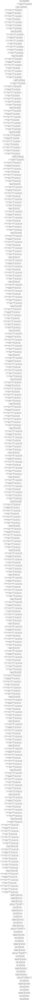

In [9]:
# Visualize the model architecture
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True, dpi=60)

Since the datasets used in this project are custom built, each element in the training, validation and testing sets is structured as a dictionary with varying keys. For example, the validation or test datasets also include bounding boxes.

This structure requires a more advanced training approach in TensorFlow. The standard model methods such as **`compile`**, **`fit`**, **`evaluate`**, and **`predict`** are not suitable here, as they expect each dataset element to follow a fixed `(inputs, outputs)` tuple format that matches the model directly.

To address this, a custom training class is implemented, providing tailored methods for training, evaluation, and inference. This class is fully compatible with distributed environments, such as **TPUs** in Google Colab or multiple **GPUs**, enabling scalable and efficient training.

The full training process, configured for 50 epochs and run on Google Colab's TPU, takes approximately **8.5 hours**.

In [ ]:
class PoseTrainer():
    """
    Trainer for pose estimation models using distributed strategies.
    This class encapsulates training, validation and prediction loops,
    with metrics (OKS, PCK, visibility accuracy), learning rate scheduling,
    checkpointing and early stopping.

    Args:
        model (tf.keras.Model): A tf.keras.Model that outputs heatmaps for keypoints.
        config (dict): Configuration with data and training parameters.
        strategy (tf.distribute.Strategy): Distribution strategy for multi‑GPU/TPU.
    """

    def __init__(self, model, config, strategy):
        self.model = model
        self.config = config
        self.strategy = strategy

        # Initialize metrics, optimizer and loss inside strategy scope
        with self.strategy.scope():
            self.oks_metric = OKSMetric(config["oks_sigmas"])
            self.pck_metric = PCKMetric(config["alpha"])
            self.acc_metric = tf.keras.metrics.BinaryAccuracy(name="vis_accuracy")

            self.loss_metric = tf.keras.metrics.Mean(name="loss")
            self.loss_fn = PoseLoss

            # Polynomial decay scheduler for learning rate
            self.scheduler = tf.keras.optimizers.schedules.PolynomialDecay(
                initial_learning_rate=config["lr0"],
                decay_steps=config["total_steps"],
                end_learning_rate=config["lrf"],
                power=config["power"]
            )
            self.optimizer = tf.keras.optimizers.Adam(self.scheduler)

    @tf.function
    def distributed_step(self, batch, training=True):
        """
        Performs one distributed training or evaluation step on the batch.

        Args:
            batch (dict[str, tf.Tensor]): A batch containing images, heatmaps, and optionally
                bounding boxes for evaluation.
            training (bool, optional): If True, apply gradients; otherwise only compute metrics.
        """
        def step_fn(inputs):
            images = inputs["images"]
            heatmaps = inputs["heatmaps"]

            if training:
                # Forward and backward pass
                with tf.GradientTape() as tape:
                    heatmaps_pred = self.model(images, training=True)
                    loss = self.loss_fn(heatmaps, heatmaps_pred)
                    loss = tf.nn.compute_average_loss(loss, global_batch_size=self.config["batch_size"])

                gradients = tape.gradient(loss, self.model.trainable_variables)
                self.optimizer.apply_gradients(zip(gradients, self.model.trainable_variables))
                self.loss_metric.update_state(loss * self.strategy.num_replicas_in_sync)

            else:
                # Validation: forward only
                heatmaps_pred = self.model(images, training=False)
                loss = self.loss_fn(heatmaps, heatmaps_pred)
                self.loss_metric.update_state(loss)

                # Convert predicted heatmaps to keypoints for metric evaluation
                keypoints = inputs["keypoints"]
                keypoints_pred = heatmaps_to_keypoints(heatmaps_pred)

                # Compute segmentation areas and bbox diagonals
                bboxes = inputs["bboxes"]
                areas = tf.reduce_prod(bboxes[:, 2:], axis=1) * 0.53
                diagonals = tf.norm(bboxes[:, 2:], axis=1)

                # Update evaluation metrics
                self.oks_metric.update_state(keypoints, keypoints_pred, areas)
                self.pck_metric.update_state(keypoints, keypoints_pred, diagonals)
                self.acc_metric.update_state(
                    tf.cast(keypoints[..., 2] > 0, tf.float32),
                    tf.cast(keypoints_pred[..., 2] > 0, tf.float32)
                )

        self.strategy.run(step_fn, args=(batch,))

    @tf.function
    def distributed_pred_step(self, batch):
        """
        Executes a distributed prediction step.

        Args:
            batch (dict[str, tf.Tensor]): Batch containing only images.

        Returns:
            (tf.Tensor): Predicted heatmaps.
        """
        def step_fn(inputs):
            return self.model(inputs["images"], training=False)
        return self.strategy.run(step_fn, args=(batch,))

    def run_epoch(self, dist_dataset, data_size, phase="train", training=True):
        """
        Runs one epoch of training or validation.

        Args:
            dist_dataset (tf.data.Dataset): Distributed dataset.
            data_size (int): Number of samples in dataset.
            phase (str, optional): 'train', 'val' or 'test'.
            training (bool, optional): True for training, False for validation.

        Returns:
            (dict[str, float]): Metric results from the epoch.
        """
        # Reset metrics at epoch start
        self.loss_metric.reset_state()
        if not training:
            self.oks_metric.reset_state()
            self.pck_metric.reset_state()
            self.acc_metric.reset_state()

        desc = phase.capitalize().rjust(5)
        phase = "" if phase == "train" else phase + "_"

        with tqdm(dist_dataset, desc=desc, total=data_size) as pbar:
            for batch in pbar:
                self.distributed_step(batch, training)

                # Gather current metrics
                results = {
                    f"{phase}loss": float(self.loss_metric.result()),
                }
                if not training:
                    results.update({
                        f"{phase}oks": float(self.oks_metric.result()),
                        f"{phase}pck": float(self.pck_metric.result()),
                        f"{phase}accuracy": float(self.acc_metric.result())
                    })
                if training:
                    results["lr"] = float(self.scheduler(self.optimizer.iterations))

                pbar.set_postfix(results)

        return results

    def train(self, train_dataset, val_dataset, resume_checkpoint=False):
        """
        Main training loop handling checkpointing, early stopping, and metric tracking.

        Args:
            train_dataset (tf.data.Dataset): Training dataset.
            val_dataset (tf.data.Dataset): Validation dataset.
            resume_checkpoint (bool, optional): Whether to resume from the last checkpoint.

        Returns:
            (pd.DataFrame): Training history.
        """
        checkpoint = tf.train.Checkpoint(model=self.model, optimizer=self.optimizer)
        checkpoint_folder = self.config["checkpoint_folder"]
        best_weights_path = os.path.join(checkpoint_folder, "best_weights.weights.h5")
        monitor = self.config["monitor"]
        mode = self.config["mode"]
        epochs = self.config["epochs"]

        # Restore previous checkpoint, history, best metric, and wait if resume is enabled
        if resume_checkpoint:
            checkpoint.restore(tf.train.latest_checkpoint(checkpoint_folder))
            history = pd.read_csv(os.path.join(checkpoint_folder, "history.csv"))

            values = history[monitor]
            best_metric = values.min() if mode == "min" else values.max()
            wait = len(history) - (values.idxmin() if mode == "min" else values.idxmax()) - 1

        else:
            os.makedirs(checkpoint_folder, exist_ok=True)
            history = pd.DataFrame(columns=[
                "loss", "lr",
                "val_loss", "val_oks", "val_pck", "val_accuracy"
            ])

            best_metric = float("inf") if mode == "min" else float("-inf")
            wait = 0

        # Prepare distributed datasets
        train_dist_dataset = self.strategy.experimental_distribute_dataset(train_dataset)
        val_dist_dataset = self.strategy.experimental_distribute_dataset(val_dataset)

        for epoch in range(len(history) + 1, epochs + 1):
            print(f"Epoch {epoch}/{epochs}")

            # Run training and validation
            train_results = self.run_epoch(train_dist_dataset, len(train_dataset), "train", training=True)
            val_results = self.run_epoch(val_dist_dataset, len(val_dataset), "val", training=False)
            print()

            # Update history
            train_results.update(val_results)
            history.loc[len(history)] = train_results

            # Early stopping logic
            current = val_results[monitor]
            improved = current < best_metric if mode == "min" else current > best_metric
            if improved:
                self.model.save_weights(best_weights_path)
                best_metric = current
                wait = 0
            else:
                wait += 1

            # Save periodic checkpoint
            if epoch % self.config["save_freq"] == 0:
                checkpoint.save(file_prefix=os.path.join(checkpoint_folder, f"epoch_{epoch}"))

            # Save history regularly or at end
            if (epoch == epochs) or (epoch % self.config["save_freq"] == 0) or (wait >= self.config["patience"]):
                history.to_csv(os.path.join(checkpoint_folder, "history.csv"), index=False)

            # Trigger early stopping if no improvement for 'patience' epochs
            if wait >= self.config["patience"]:
                print(f"Early stopping triggered after {wait} epochs without improvement.")
                break

        # Restore best model and save final weights
        self.model.load_weights(best_weights_path)
        self.model.save_weights(self.config["model_save_path"])
        return history

    def eval(self, dataset, phase="val"):
        """
        Runs validation on a non-distributed dataset.

        Args:
            dataset (tf.data.Dataset): Evaluation dataset.
            phase (str, optional): 'val' or 'test'.

        Returns:
            (dict[str, float]): Evaluation metrics.
        """
        dist_dataset = self.strategy.experimental_distribute_dataset(dataset)
        return self.run_epoch(dist_dataset, len(dataset), phase, training=False)

    def predict(self, dataset, return_kpts=True, steps=None):
        """
        Generates predictions from the model using distributed inference.

        Args:
            dataset (tf.data.Dataset): Dataset to predict on.
            return_kpts (bool, optional): Whether to convert heatmaps to keypoints.
            steps (int, optional): Number of steps to run, or None for full dataset.

        Returns:
            (tf.Tensor): Concatenated predictions from all batches.
        """
        dist_dataset = self.strategy.experimental_distribute_dataset(dataset)
        all_preds = []

        with tqdm(total=steps or len(dataset)) as pbar:
            for i, batch in enumerate(dist_dataset, 1):
                preds = self.distributed_pred_step(batch)
                preds = self.strategy.gather(preds, axis=0) # Gather predictions from all replicas
                if return_kpts:
                    preds = heatmaps_to_keypoints(preds)
                all_preds.append(preds)

                pbar.update(1)
                if i == steps:
                    break

        return tf.concat(all_preds, axis=0)

In [ ]:
trainer = PoseTrainer(model, config, strategy)
history = trainer.train(train_dataset, test_dataset, resume_checkpoint=True)

Epoch 41/50


  Val: 100%|██████████| 181/181 [05:44<00:00,  1.90s/it, val_loss=1.66, val_oks=0.928, val_pck=0.938, val_accuracy=0.939]



Epoch 42/50


  Val: 100%|██████████| 181/181 [04:43<00:00,  1.57s/it, val_loss=1.66, val_oks=0.928, val_pck=0.937, val_accuracy=0.939]



Epoch 43/50


  Val: 100%|██████████| 181/181 [04:44<00:00,  1.57s/it, val_loss=1.65, val_oks=0.929, val_pck=0.938, val_accuracy=0.939]



Epoch 44/50


  Val: 100%|██████████| 181/181 [04:44<00:00,  1.57s/it, val_loss=1.65, val_oks=0.929, val_pck=0.937, val_accuracy=0.939]



Epoch 45/50


  Val: 100%|██████████| 181/181 [04:44<00:00,  1.57s/it, val_loss=1.65, val_oks=0.929, val_pck=0.938, val_accuracy=0.939]



Epoch 46/50


  Val: 100%|██████████| 181/181 [04:44<00:00,  1.57s/it, val_loss=1.65, val_oks=0.929, val_pck=0.938, val_accuracy=0.939]



Epoch 47/50


  Val: 100%|██████████| 181/181 [04:43<00:00,  1.57s/it, val_loss=1.66, val_oks=0.929, val_pck=0.938, val_accuracy=0.94]



Epoch 48/50


  Val: 100%|██████████| 181/181 [04:45<00:00,  1.58s/it, val_loss=1.65, val_oks=0.929, val_pck=0.937, val_accuracy=0.94]



Epoch 49/50


  Val: 100%|██████████| 181/181 [04:45<00:00,  1.58s/it, val_loss=1.65, val_oks=0.929, val_pck=0.938, val_accuracy=0.939]



Epoch 50/50


  Val: 100%|██████████| 181/181 [04:45<00:00,  1.58s/it, val_loss=1.66, val_oks=0.929, val_pck=0.938, val_accuracy=0.94]



Early stopping triggered after 7 epochs without improvement.


## **Model Evaluation**

### **Training and Validation Curves**

In [ ]:
#history = pd.read_csv(os.path.join(config["checkpoint_folder"], "history.csv"))
idxmax = history[config["monitor"]].idxmax()
history = history.rename(columns={
    "loss": "Loss",
    "val_loss": "Val Loss",
    "val_oks": "Val OKS",
    "val_pck": f"Val PCK@{config['alpha']}",
    "val_accuracy": "Val Vis. Accuracy"
})

In [ ]:
def plot_metrics(history, metrics=None, idxmax=None, renderer=None):
    """
    Plots the evolution of training and validation metrics over epochs using Plotly.

    Args:
        history (pd.DataFrame): DataFrame containing the training history with one column per metric.
        metrics (list[str], optional): List of metric names to plot. If None, all columns will be plotted.
        idxmax (int, optional): Index of the best epoch based on the monitored metric. If None, no vertical line is shown.
        renderer (str, optional): Renderer to use for Plotly (e.g., 'notebook', 'colab', 'png').
    """
    epochs = len(history)
    if metrics is None:
        metrics = history.columns.tolist()

    list_epochs = np.arange(1, epochs + 1)
    fig = go.Figure()

    for metric in metrics:
        if metric not in history.columns:
            raise ValueError(f"Metric '{metric}' not found in history columns.")

        # Add line plot for the current metric
        fig.add_trace(go.Scatter(
            x=list_epochs,
            y=history[metric],
            name=metric,
            mode="lines",
            line=dict(width=2)
        ))

    # Add vertical line for early stopping point, if provided
    if idxmax is not None:
        fig.add_vline(
            x=idxmax + 1,
            line=dict(color="red", width=2, dash="dash"),
            annotation_text="Early Stopping",
            annotation_position="top left",
            annotation=dict(font_size=12, font_color="red")
        )

    # Determine whether we're plotting losses, metrics, or mixed
    is_loss = all("loss" in m.lower() for m in metrics)
    is_metric = all("loss" not in m.lower() for m in metrics)

    title_text = "Loss Evolution" if is_loss else (
        "Metric Evolution" if is_metric else "Loss and Metric Evolution"
    )
    yaxis_text = "Loss" if is_loss else (
        "Metric" if is_metric else "Value"
    )

    # Axis and layout customization
    fig.update_layout(
        title=title_text,
        title_font=dict(size=18),
        title_x=0.5,
        xaxis_title="Epoch",
        yaxis_title=yaxis_text,
        width=1000,
        height=500
    )

    fig.show(renderer=renderer)

In [ ]:
# Interactive graphics
plot_metrics(history, history.columns[[0, 2]], idxmax)
plot_metrics(history, history.columns[3:], idxmax)

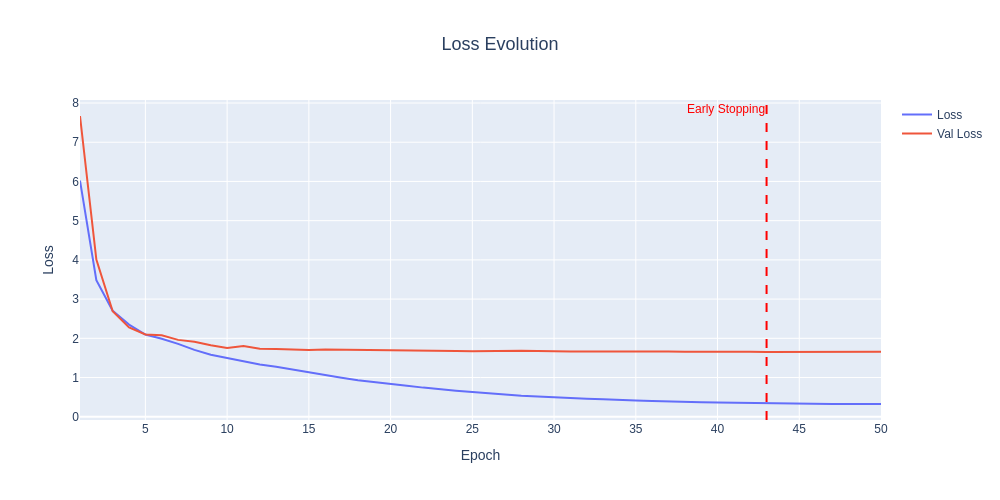

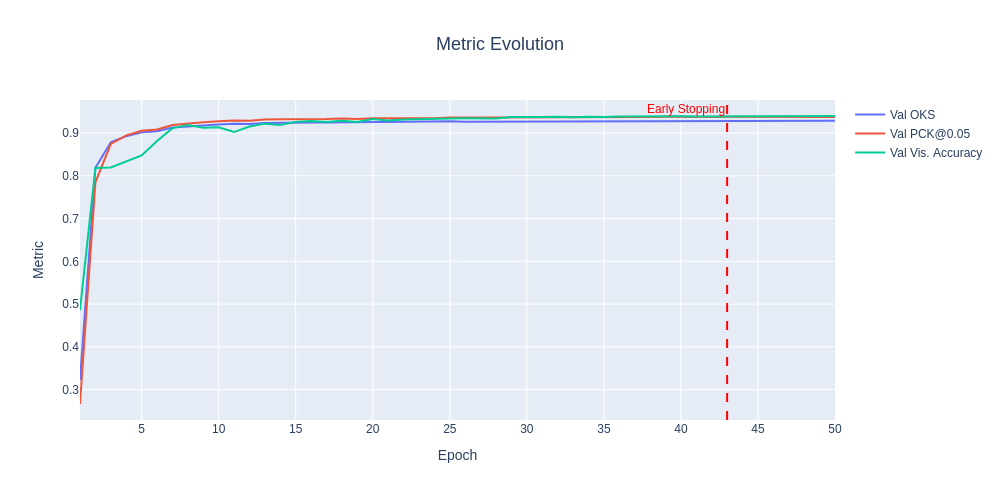

In [ ]:
# Static images for GitHub
plot_metrics(history, history.columns[[0, 2]], idxmax, "png")
plot_metrics(history, history.columns[3:], idxmax, "png")

### **OKS and PCK**

Since the CUB-200-2011 dataset does not provide an official validation split, the test set was used during training to monitor the **validation OKS**. As a result, the model's performance has already been evaluated on this set.

However, to demonstrate the usage of the `eval` method implemented in the custom training class, the evaluation is performed again on the test set. This not only illustrates how to apply the method with datasets that do include all three standard splits (training, validation, and test), but also helps to reaffirm and fine-tune the previously obtained results.

In [ ]:
# Load the trained model weights
tf.keras.backend.clear_session()

with strategy.scope():
    model = build_convnext_pose_unet(config["image_size"] + (3,), config["nkpts"])
    model.load_weights(config["model_save_path"])

In [ ]:
test_results = trainer.eval(test_dataset, phase="test")

 Test: 100%|██████████| 181/181 [05:49<00:00,  1.93s/it, test_loss=1.65, test_oks=0.929, test_pck=0.938, test_accuracy=0.939]


In [ ]:
pd.DataFrame({
    "Loss": [test_results["test_loss"]],
    "OKS": [test_results["test_oks"]],
    f"PCK@{config['alpha']}": [test_results["test_pck"]],
    "Visibility Accuracy": [test_results["test_accuracy"]]
}, index=["Test"])

,Loss,OKS,PCK@0.05,Visibility Accuracy
Test,1.651809,0.928906,0.9379,0.938823


## **Inference with the Trained Model**

### **Test Dataset**

Since the execution environment is a TPU in Google Colab, predictions will be performed on the entire test dataset. However, this can be easily adapted to run on a specific number of steps (batches), which is useful in cases where memory is limited.

In [ ]:
oks_metric = OKSMetric(config["oks_sigmas"])
pck_metric = PCKMetric(config["alpha"])
steps = None # 10

In [ ]:
# Predict keypoints on the test dataset
keypoints_pred = trainer.predict(test_dataset, steps=steps).numpy()

100%|██████████| 181/181 [07:42<00:00,  2.56s/it]


In [ ]:
# Extract test dataset elements
images = []
keypoints = []
bboxes = []

with tqdm(total=steps or len(test_dataset)) as pbar:
    for i, batch in enumerate(test_dataset, 1):
        images.append(batch["images"].numpy())
        keypoints.append(batch["keypoints"].numpy())
        bboxes.append(batch["bboxes"].numpy())

        pbar.update(1)
        if i == steps:
            break


# Merge all batches and normalize images
images = np.concat(images) / 255
keypoints = np.concat(keypoints)
bboxes = np.concat(bboxes)

# Compute segmentation areas and bbox diagonals
areas = bboxes[:, 2:].prod(axis=1) * 0.53
diagonals = np.linalg.norm(bboxes[:, 2:], axis=1)

100%|██████████| 181/181 [04:17<00:00,  1.42s/it]


#### **Heatmap Prediction Visualization**

Before moving on to the visualizations, let's first analyze the heatmaps predicted by the model using the following example. As shown, the model has learned not only to accurately localize the keypoints but also to effectively classify their visibility. It assigns values close to zero for non-visible keypoints and values close to one for visible ones. This demonstrates that the binary cross entropy loss was both effective and necessary for the visibility prediction task.

In [ ]:
# Predict the first batch of heatmaps
heatmaps_pred = trainer.predict(test_dataset, return_kpts=False, steps=1).numpy()

100%|██████████| 1/1 [00:03<00:00,  3.51s/it]


In [ ]:
idx = 0
print(keypoints[idx][:, 2])
print(keypoints_pred[idx][:, 2])
print(heatmaps_pred[idx].max(axis=(0, 1)))

[2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 0. 2. 0. 2. 2.]
[2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 0. 2. 0. 2. 2.]
[0.95134705 0.95793575 0.9601625  0.956481   0.96599376 0.931396
 0.9540461  0.90859413 0.96378016 0.9552379  0.1154168  0.8548957
 0.07684818 0.5572375  0.95260763]


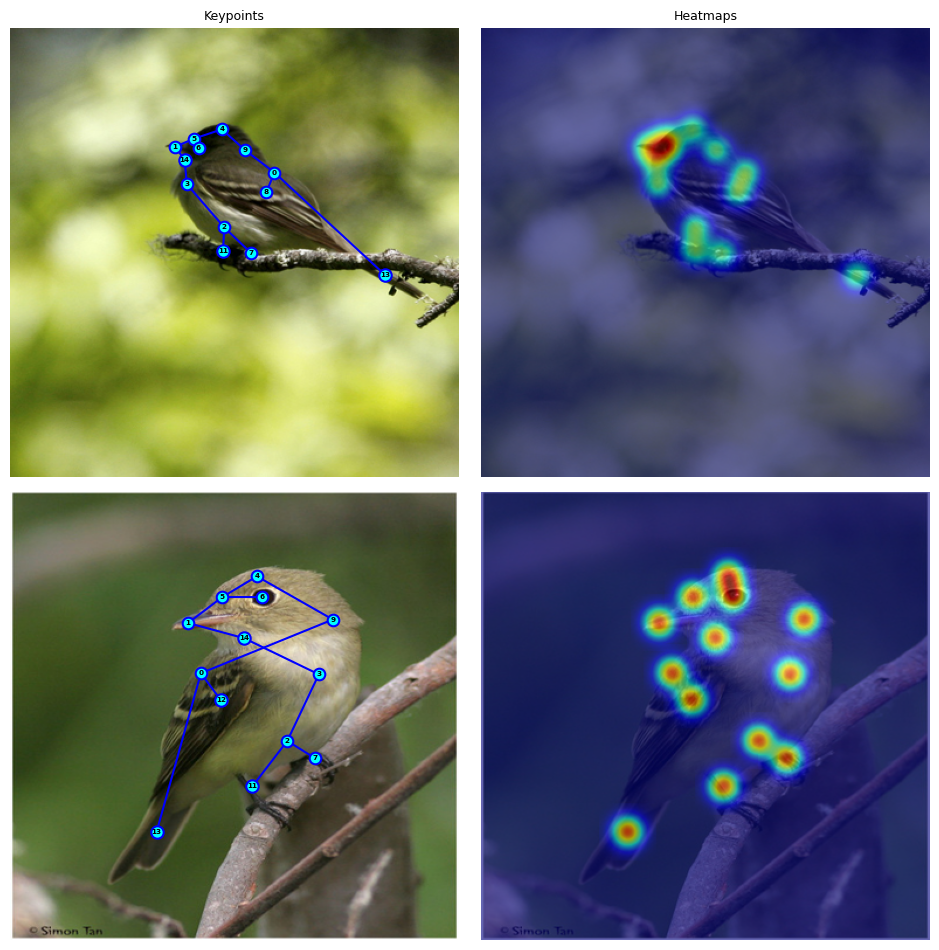

In [ ]:
# Visualize ground truth heatmaps and keypoints for the first 2 samples
visualizer.plot_keypoints_heatmaps(images, keypoints, config=config, random=False)

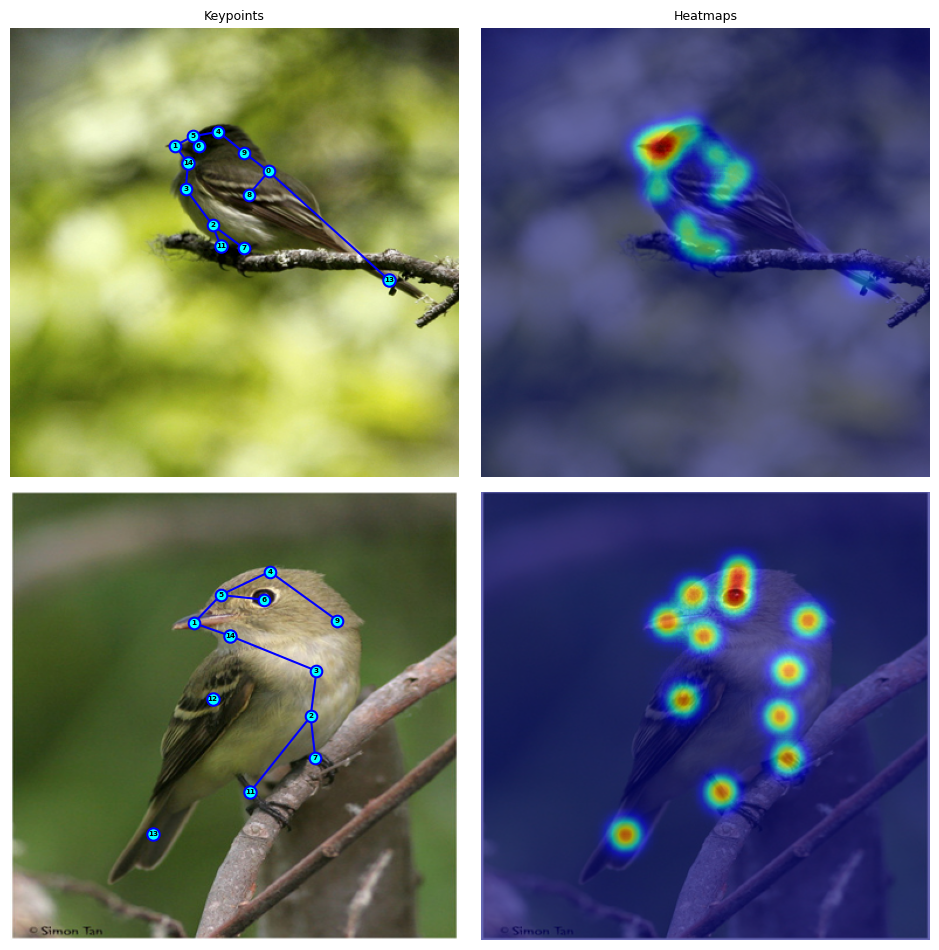

In [ ]:
# Visualize predicted heatmaps and keypoints for the first 2 samples
visualizer.plot_keypoints_heatmaps(images, keypoints_pred, heatmaps_pred, random=False)

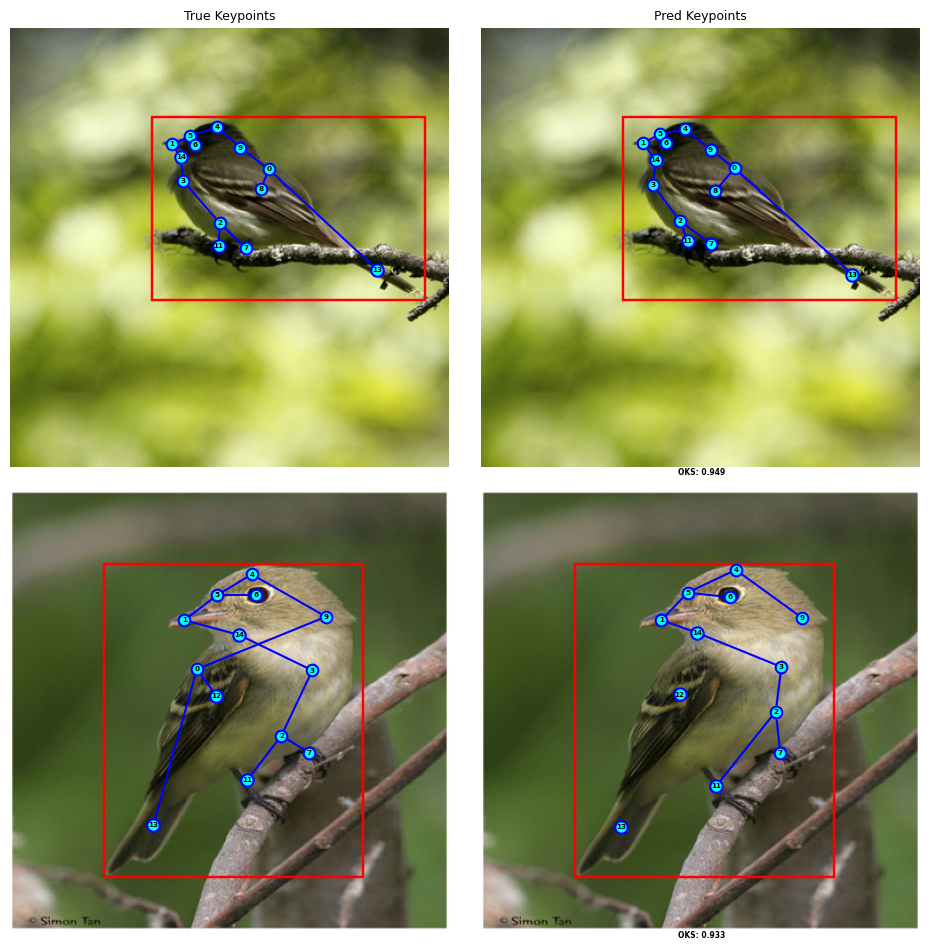

In [ ]:
# Visualize both ground truth and predicted keypoints for the first 2 samples
visualizer.plot_keypoints(images, keypoints, keypoints_pred, bboxes, areas, oks_metric, random=False)

The model demonstrates the ability to generate heatmaps without explicitly applying Gaussian blur to the keypoints. Each heatmap has a peak activation near 1 at its center, which smoothly decays as the distance from the center increases reflecting accurate spatial representation. Furthermore, the keypoint localization is precise, as also illustrated in the following examples.

One important consideration is that the **CUB-200-2011** dataset contains 200 bird species of various sizes, poses, and orientations. This diversity introduces slight variations in the actual positions of the 15 annotated keypoints across individuals. For instance, the **leg keypoints** may be labeled differently: in some cases near the toes, while in others closer to the tarsal joint.

In addition, some keypoints are partially or completely occluded in certain images. In such cases, annotations may or may not include them, introducing inconsistency. These factors can affect the model's generalization.

#### **Keypoint Prediction Visualization**

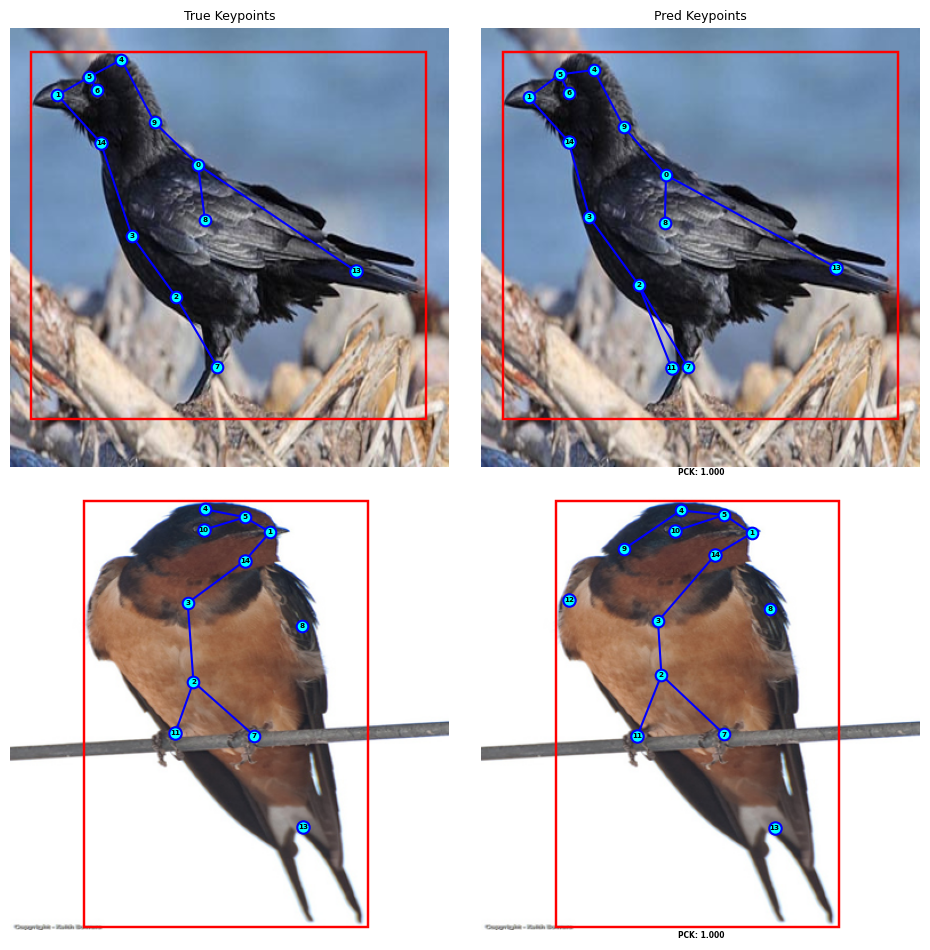

In [ ]:
visualizer.plot_keypoints(
    images, keypoints, keypoints_pred, bboxes, diagonals, pck_metric,
    save_path="AnimalPoseEstimation_ConvNeXtBase-U-Net_CUB-200-2011_1.png"
)

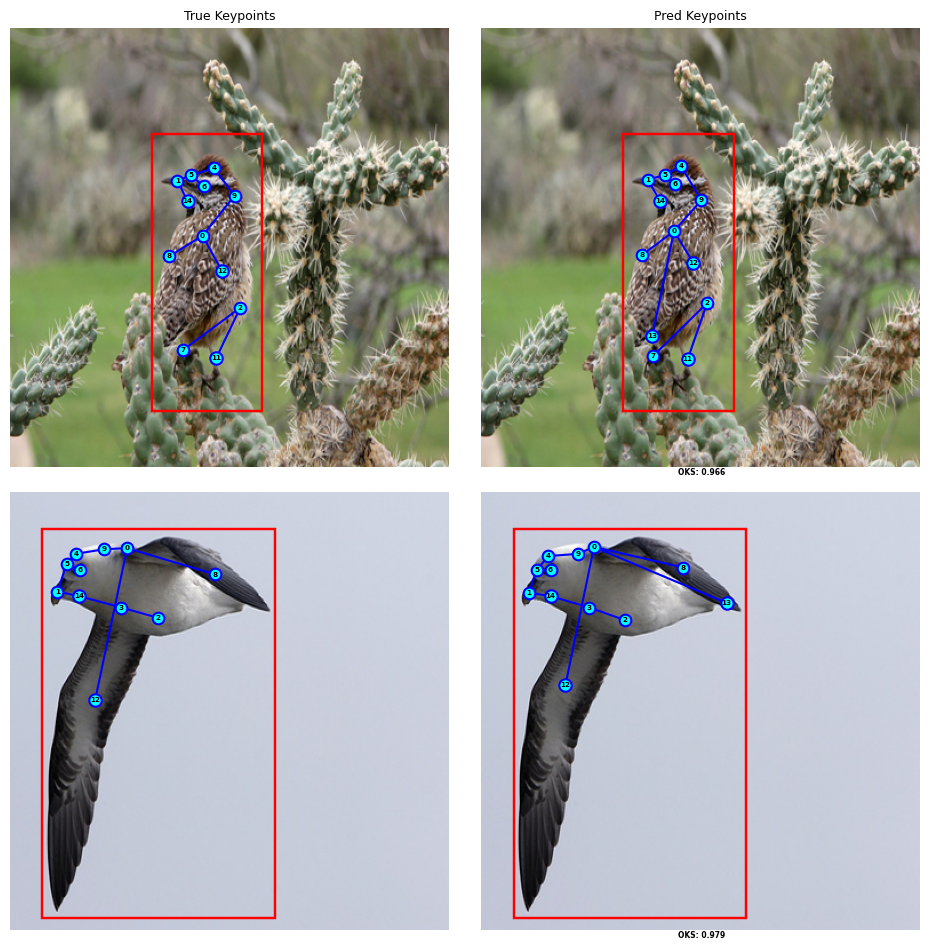

In [ ]:
visualizer.plot_keypoints(
    images, keypoints, keypoints_pred, bboxes, areas, oks_metric,
    save_path="AnimalPoseEstimation_ConvNeXtBase-U-Net_CUB-200-2011_2.png"
)

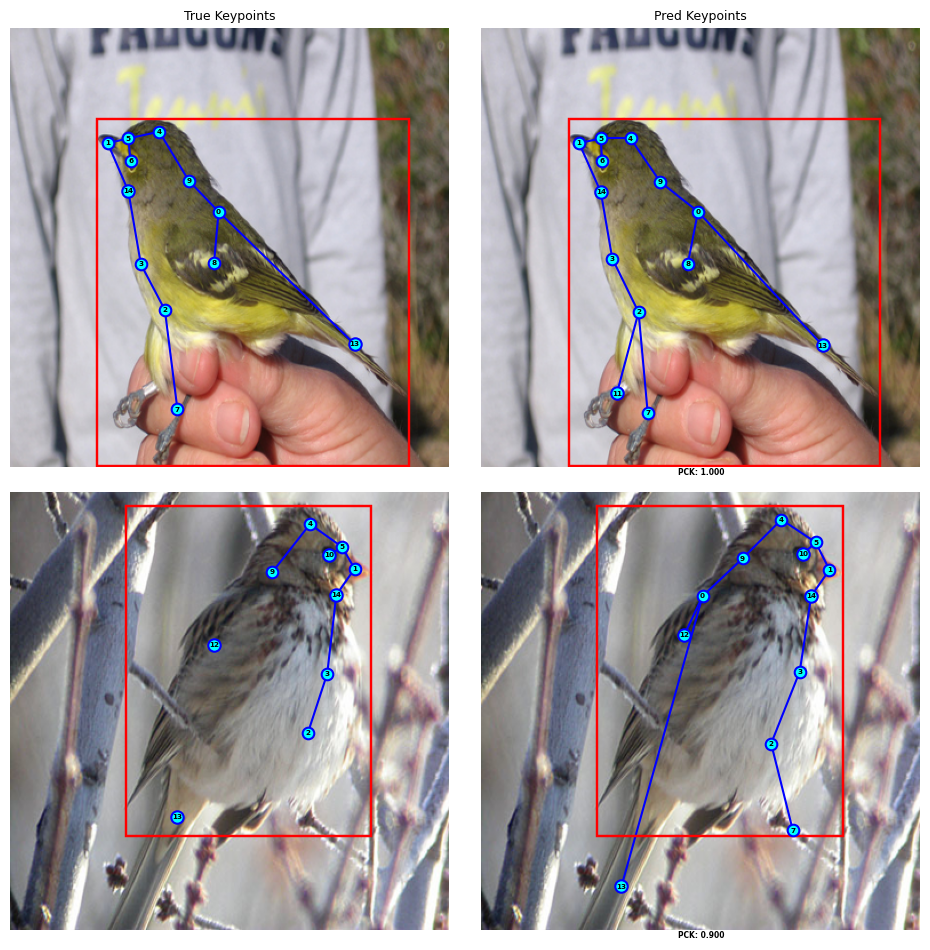

In [ ]:
visualizer.plot_keypoints(images, keypoints, keypoints_pred, bboxes, diagonals, pck_metric)

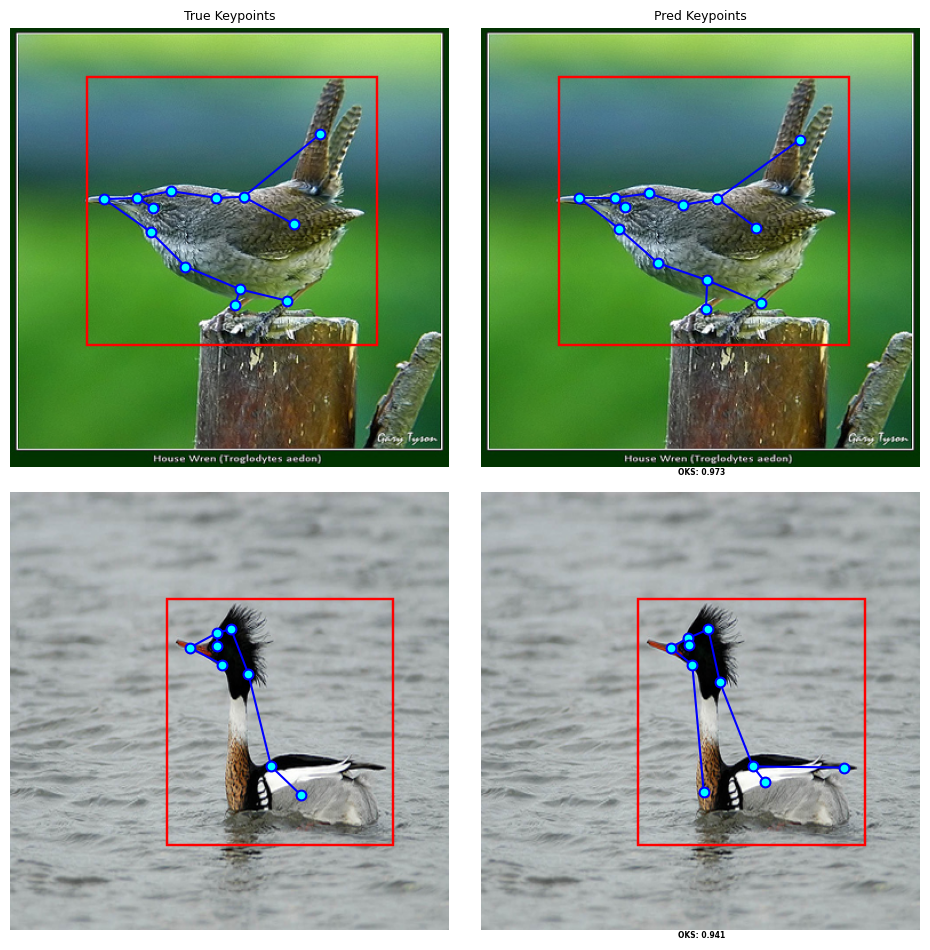

In [ ]:
visualizer.plot_keypoints(images, keypoints, keypoints_pred, bboxes, areas, oks_metric, show_kpts_ids=False)

### **Internet Images**

Inference on the test set has already demonstrated how to perform predictions in a **distributed environment** using the trained model.

Now, I present how to run inference in a **non-distributed environment**, such as a GPU session in Google Colab, using images of people sourced from the internet. This also provides an opportunity to evaluate the model's ability to generalize to unseen data outside the CUB-200-2011 dataset.

In [ ]:
# Load model weights in a non-distributed environment
tf.keras.backend.clear_session()
model = build_convnext_pose_unet(config["image_size"] + (3,), config["nkpts"])
model.load_weights(config["model_save_path"])

350926856/350926856 [==============================] - 16s 0us/step


In [ ]:
image_urls = [
    "https://live.staticflickr.com/65535/47057120154_e3fa046c41_b.jpg",
    "https://i.pinimg.com/564x/f9/5d/d2/f95dd2a1ea8ce6fe90c61472576eb451.jpg",
    "https://tgreybirds.com/PelagicCormorant09.jpg",
    "https://leesbird.com/wp-content/uploads/2017/06/vermillion-flycatcher-male-flying-brentpaull.jpg?w=640",

    "https://media01.stockfood.com/largepreviews/MjIwMjU5MTU0MA==/71051340-Cape-Starling-Cape-Glossy-Starling-Lamprotornis-nitens-a-species-of-starling-in-the-Sturnidae-family-South.jpg",
    "https://www.eopugetsound.org/sites/default/files/topical_article/images/28777858956_350d7b5be5_b_0.jpg",
    "https://feathersandflora.com/wp-content/uploads/2018/05/0e4a7678.jpg?w=1400",
    "https://live.staticflickr.com/8311/28912864553_bc32e3f5e9_c.jpg"
]

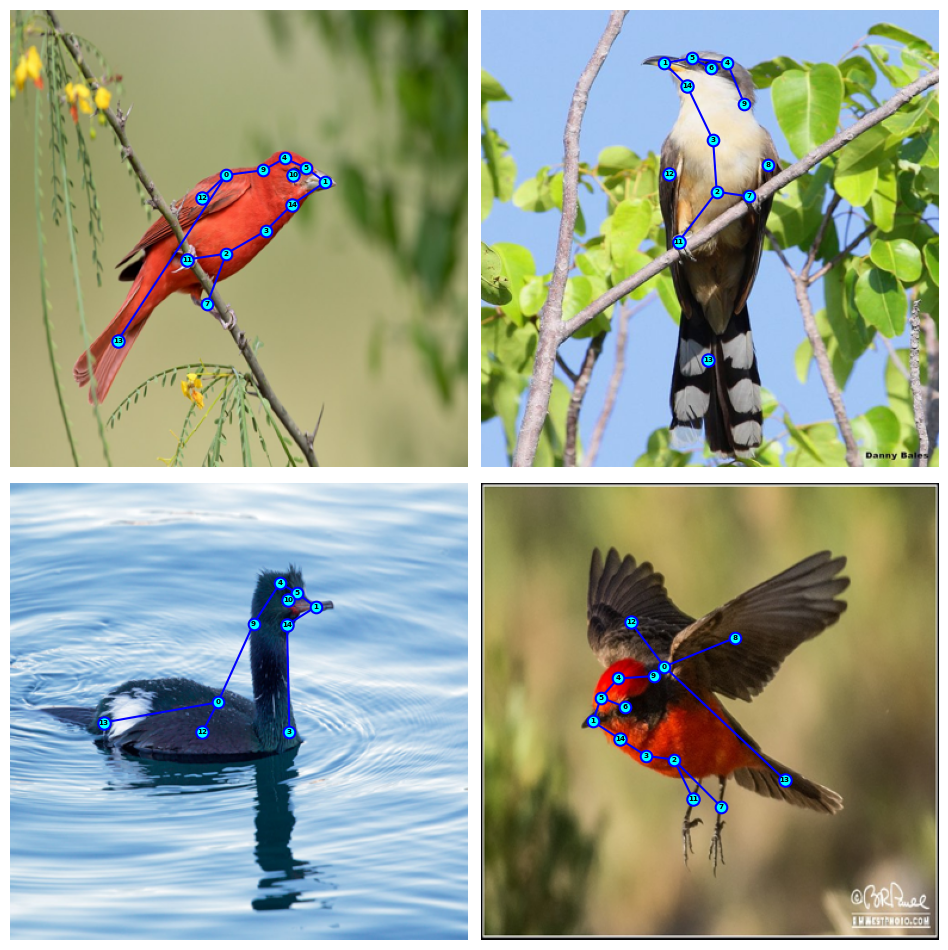

In [ ]:
visualizer.plot_from_urls(
    model, image_urls[:4], config["image_size"],
    save_path="AnimalPoseEstimation_ConvNeXtBase-U-Net_CUB-200-2011_3.png"
)

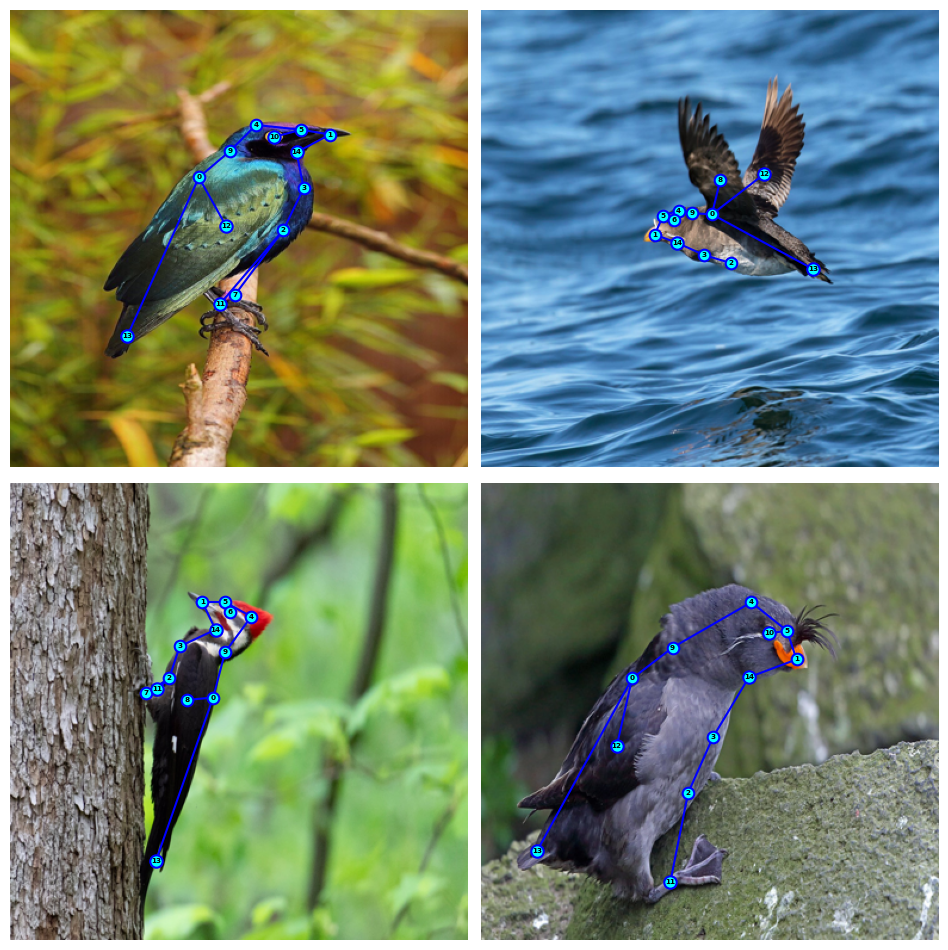

In [ ]:
visualizer.plot_from_urls(model, image_urls[4:], config["image_size"])

## **Conclusion**

The **ConvNeXtBase U-Net** model achieved an **OKS** of **0.929**, a **PCK@0.05** of **0.938**, and a **visibility accuracy** of **0.939** on the test set of the **CUB-200-2011** dataset. These results demonstrate strong performance in animal pose estimation and highlight the model's excellent ability to generalize across bird species with varying sizes, poses, and visual conditions.

Nevertheless, there is still room for improvement. Qualitative analysis revealed certain inconsistencies in the ground truth annotations such as slight positional differences for the same keypoint across similar specimens (e.g., on the legs or wings), as well as ambiguous visibility in partially occluded regions. Increasing the size of the dataset could further enhance the model's robustness and generalization.

For more advanced applications, such as detecting and estimating the pose of **multiple birds per image**, adopting more powerful architectures like **Ultralytics YOLO-pose**, along with datasets containing multiple instances, would be necessary. However, for the scope of this project accurately localizing the keypoints of a **single bird per image** the achieved results represent a significant accomplishment and a strong foundation for future work.